In [1]:
# import os

# os.environ["KERAS_BACKEND"] = "tensorflow"

# Setting random seed to obtain reproducible results.
import tensorflow as tf

tf.random.set_seed(42)

import keras
from keras import layers

import os
import glob
import imageio.v2 as imageio
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize global variables.
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 5
# NUM_SAMPLES = 32
POS_ENCODE_DIMS = 16
EPOCHS = 100

NUM_SAMPLES_COARSE = 64
NUM_SAMPLES_FINE_IMPORTANCE = 64

WARMUP_EPOCHS = 10

2025-05-12 15:02:02.426000: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-12 15:02:02.468398: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-12 15:02:03.081574: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# Download the data if it does not already exist.
url = (
    "http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz"
)
data = tf.keras.utils.get_file(origin=url)

data = np.load(data)
images = data["images"]
im_shape = images.shape
(num_images, H, W, _) = images.shape
(poses, focal) = (data["poses"], data["focal"])

# Plot a random image from the dataset for visualization.
# plt.imshow(images[np.random.randint(low=0, high=num_images)])
# plt.show()

In [3]:
def sample_pdf(bins, weights, N_samples, det=False):
    weights = weights + 1e-5
    pdf = weights / tf.reduce_sum(weights, axis=-1, keepdims=True)
    cdf = tf.cumsum(pdf, axis=-1)
    cdf = tf.concat([tf.zeros_like(cdf[..., :1]), cdf], axis=-1)

    if det:
        u = tf.linspace(0.0, 1.0, N_samples)
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.broadcast_to(u, u_shape)
    else:
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.random.uniform(u_shape)

    inds = tf.searchsorted(cdf, u, side='right')

    below = tf.maximum(0, inds - 1)
    above = tf.minimum(tf.shape(cdf)[-1] - 1, inds)
    inds_g = tf.stack([below, above], axis=-1)

    batch_dims_for_gather = cdf.shape.rank - 1
    if batch_dims_for_gather < 0: # rank가 None일 경우 대비
        batch_dims_for_gather = tf.maximum(0, tf.rank(cdf) -1)

    if bins.shape.rank is not None and cdf.shape.rank is not None and bins.shape.rank != cdf.shape.rank:
        pass

    cdf_g = tf.gather(cdf, inds_g, batch_dims=batch_dims_for_gather)
    bins_g = tf.gather(bins, inds_g, batch_dims=batch_dims_for_gather)

    denom = cdf_g[..., 1] - cdf_g[..., 0]
    denom = tf.where(denom < 1e-5, tf.ones_like(denom), denom)
    t = (u - cdf_g[..., 0]) / denom
    samples = bins_g[..., 0] + t * (bins_g[..., 1] - bins_g[..., 0])
    return samples

In [7]:

def encode_position(x):
    """Encodes the position into its corresponding Fourier feature.

    Args:
        x: The input coordinate.

    Returns:
        Fourier features tensors of the position.
    """
    positions = [x]
    for i in range(POS_ENCODE_DIMS):
        for fn in [tf.sin, tf.cos]:
            positions.append(fn(2.0**i * x))
    return tf.concat(positions, axis=-1)


def get_rays(height, width, focal, pose):
    """Computes origin point and direction vector of rays.

    Args:
        height: Height of the image.
        width: Width of the image.
        focal: The focal length between the images and the camera.
        pose: The pose matrix of the camera.

    Returns:
        Tuple of origin point and direction vector for rays.
    """
    # Build a meshgrid for the rays.
    i, j = tf.meshgrid(
        tf.range(width, dtype=tf.float32),
        tf.range(height, dtype=tf.float32),
        indexing="xy",
    )

    # Normalize the x axis coordinates.
    transformed_i = (i - width * 0.5) / focal

    # Normalize the y axis coordinates.
    transformed_j = (j - height * 0.5) / focal

    # Create the direction unit vectors.
    directions = tf.stack([transformed_i, -transformed_j, -tf.ones_like(i)], axis=-1)

    # Get the camera matrix.
    camera_matrix = pose[:3, :3]
    height_width_focal = pose[:3, -1]

    # Get origins and directions for the rays.
    transformed_dirs = directions[..., None, :]
    camera_dirs = transformed_dirs * camera_matrix
    ray_directions = tf.reduce_sum(camera_dirs, axis=-1)
    ray_origins = tf.broadcast_to(height_width_focal, tf.shape(ray_directions))

    # Return the origins and directions.
    return (ray_origins, ray_directions)

def render_flat_rays_for_coarse(ray_origins, ray_directions, near, far, num_samples, perturb=False):
    if perturb:
        shape_prefix = tf.shape(ray_origins)[:-1]
        bin_starts_flat = tf.linspace(near, far, num_samples + 1)[:-1]
        
        shape_prefix_dims_len = tf.rank(ray_origins) - 1
        view_shape_for_linspace = tf.concat([tf.ones(shape_prefix_dims_len, dtype=tf.int32), [num_samples]], axis=0)
        bin_starts_b = tf.reshape(bin_starts_flat, view_shape_for_linspace)
        
        bin_width = (far - near) / num_samples
        
        rand_shape = tf.concat([shape_prefix, [num_samples]], axis=0)
        random_offsets = tf.random.uniform(shape=rand_shape) * bin_width
        
        t_vals_shaped = bin_starts_b + random_offsets
    else:
        _t_vals_flat = tf.linspace(near, far, num_samples)
        shape_prefix = tf.shape(ray_origins)[:-1]
        t_vals_shaped = tf.broadcast_to(_t_vals_flat, tf.concat([shape_prefix, [num_samples]], axis=0))

    rays = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_shaped[..., None]
    )
    
    rays_flat = tf.reshape(rays, [-1, 3])
    rays_flat_encoded = encode_position(rays_flat)
    
    return (rays_flat_encoded, t_vals_shaped)

def map_fn(pose):
    (ray_origins, ray_directions) = get_rays(height=H, width=W, focal=focal, pose=pose)
    return (ray_origins, ray_directions)

# Create the training split.
split_index = int(num_images * 0.8)

# Split the images into training and validation.
train_images = images[:split_index]
val_images = images[split_index:]

# Split the poses into training and validation.
train_poses = poses[:split_index]
val_poses = poses[split_index:]

# Make the training pipeline.
train_img_ds = tf.data.Dataset.from_tensor_slices(train_images)
train_pose_ds = tf.data.Dataset.from_tensor_slices(train_poses)
train_ray_ds = train_pose_ds.map(map_fn, num_parallel_calls=AUTO)
training_ds = tf.data.Dataset.zip((train_img_ds, train_ray_ds))
train_ds = (
    training_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

# Make the validation pipeline.
val_img_ds = tf.data.Dataset.from_tensor_slices(val_images)
val_pose_ds = tf.data.Dataset.from_tensor_slices(val_poses)
val_ray_ds = val_pose_ds.map(map_fn, num_parallel_calls=AUTO)
validation_ds = tf.data.Dataset.zip((val_img_ds, val_ray_ds))
val_ds = (
    validation_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

In [8]:
SINGLE_COORD_ENCODED_DIMS = 2 * 3 * POS_ENCODE_DIMS + 3

def get_nerf_model_modified(num_layers, encoded_dims_per_coord):
    inputs = keras.Input(shape=(encoded_dims_per_coord,))
    x = inputs
    for i in range(num_layers):
        x = layers.Dense(units=64, activation="relu")(x)
        if i % 4 == 0 and i > 0:
            x = layers.concatenate([x, inputs], axis=-1)
    outputs = layers.Dense(units=4)(x)
    return keras.Model(inputs=inputs, outputs=outputs)

def render_rays_hierarchical(
    model_coarse,
    model_fine,
    ray_origins,
    ray_directions,
    near,
    far,
    perturb_coarse=True,
    train=True # 이 train 인자를 모델 호출 시 training 인자로 사용
    ):

    current_batch_size = tf.shape(ray_origins)[0]
    h_dim = tf.shape(ray_origins)[1]
    w_dim = tf.shape(ray_origins)[2]

    rays_flat_coarse_encoded, t_vals_coarse = render_flat_rays_for_coarse(
        ray_origins, ray_directions, near, far, NUM_SAMPLES_COARSE, perturb=perturb_coarse
    )

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_coarse_flat = model_coarse(rays_flat_coarse_encoded, training=train)

    predictions_coarse = tf.reshape(
        predictions_coarse_flat,
        shape=(current_batch_size, h_dim, w_dim, NUM_SAMPLES_COARSE, 4)
    )

    rgb_coarse_samples = tf.sigmoid(predictions_coarse[..., :-1])
    sigma_a_coarse_samples = tf.nn.relu(predictions_coarse[..., -1])

    delta_coarse = t_vals_coarse[..., 1:] - t_vals_coarse[..., :-1]
    delta_coarse = tf.concat(
        [delta_coarse, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_coarse)[:-1],[1]], axis=0) )], axis=-1
    )

    alpha_coarse = 1.0 - tf.exp(-sigma_a_coarse_samples * delta_coarse)
    epsilon = 1e-10
    transmittance_coarse = tf.math.cumprod(1.0 - alpha_coarse + epsilon, axis=-1, exclusive=True)
    weights_coarse = alpha_coarse * transmittance_coarse

    rgb_coarse = tf.reduce_sum(weights_coarse[..., None] * rgb_coarse_samples, axis=-2)
    depth_coarse = tf.reduce_sum(weights_coarse * t_vals_coarse, axis=-1)
    acc_coarse = tf.reduce_sum(weights_coarse, axis=-1)

    t_vals_mid_coarse = .5 * (t_vals_coarse[..., 1:] + t_vals_coarse[..., :-1])
    weights_for_pdf = weights_coarse[..., :-1]

    t_samples_fine_importance = sample_pdf(
        bins=t_vals_mid_coarse,
        weights=weights_for_pdf,
        N_samples=NUM_SAMPLES_FINE_IMPORTANCE,
        det=not train
    )
    t_samples_fine_importance = tf.stop_gradient(t_samples_fine_importance)

    t_vals_fine_combined = tf.sort(
        tf.concat([t_vals_coarse, t_samples_fine_importance], axis=-1), axis=-1
    )

    rays_fine = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_fine_combined[..., None]
    )
    
    rays_fine_flat = tf.reshape(rays_fine, [-1, 3])
    rays_fine_flat_encoded = encode_position(rays_fine_flat)

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_fine_flat = model_fine(rays_fine_flat_encoded, training=train)
    
    num_total_fine_samples = NUM_SAMPLES_COARSE + NUM_SAMPLES_FINE_IMPORTANCE
    predictions_fine = tf.reshape(
        predictions_fine_flat,
        shape=(current_batch_size, h_dim, w_dim, num_total_fine_samples, 4)
    )

    rgb_fine_samples = tf.sigmoid(predictions_fine[..., :-1])
    sigma_a_fine_samples = tf.nn.relu(predictions_fine[..., -1])

    delta_fine = t_vals_fine_combined[..., 1:] - t_vals_fine_combined[..., :-1]
    delta_fine = tf.concat(
        [delta_fine, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_fine)[:-1],[1]], axis=0))], axis=-1
    )

    alpha_fine = 1.0 - tf.exp(-sigma_a_fine_samples * delta_fine)
    transmittance_fine = tf.math.cumprod(1.0 - alpha_fine + epsilon, axis=-1, exclusive=True)
    weights_fine = alpha_fine * transmittance_fine

    rgb_fine = tf.reduce_sum(weights_fine[..., None] * rgb_fine_samples, axis=-2)
    depth_fine = tf.reduce_sum(weights_fine * t_vals_fine_combined, axis=-1)
    acc_fine = tf.reduce_sum(weights_fine, axis=-1)
    
    extras = {
        "rgb_coarse": rgb_coarse,
        "depth_coarse": depth_coarse,
        "acc_coarse": acc_coarse,
        "acc_fine": acc_fine,
    }

    return rgb_fine, depth_fine, extras

Epoch 1/100
16/16 [==============================] - ETA: 0s - total_loss: 0.1134 - coarse_loss: 0.1134 - fine_loss: 0.0000e+00 - coarse_psnr: 9.7208 - fine_psnr: 8.3753

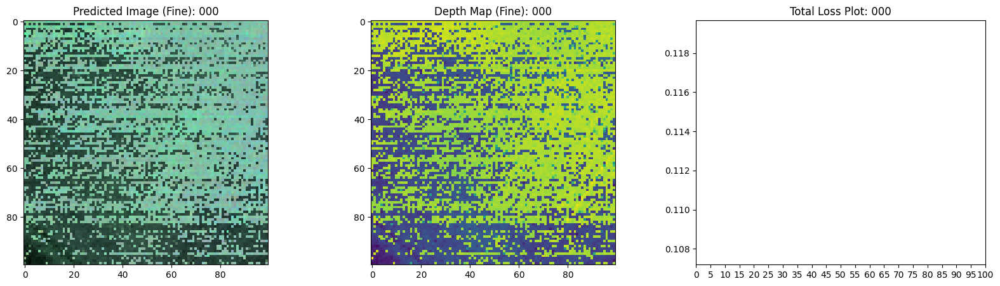

16/16 [==============================] - 14s 742ms/step - total_loss: 0.1134 - coarse_loss: 0.1134 - fine_loss: 0.0000e+00 - coarse_psnr: 9.7208 - fine_psnr: 8.3753 - val_total_loss: 0.2284 - val_coarse_loss: 0.0726 - val_fine_loss: 0.1558 - val_coarse_psnr: 11.6474 - val_fine_psnr: 8.1022
Epoch 2/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0651 - coarse_loss: 0.0651 - fine_loss: 0.0000e+00 - coarse_psnr: 12.3174 - fine_psnr: 8.3857

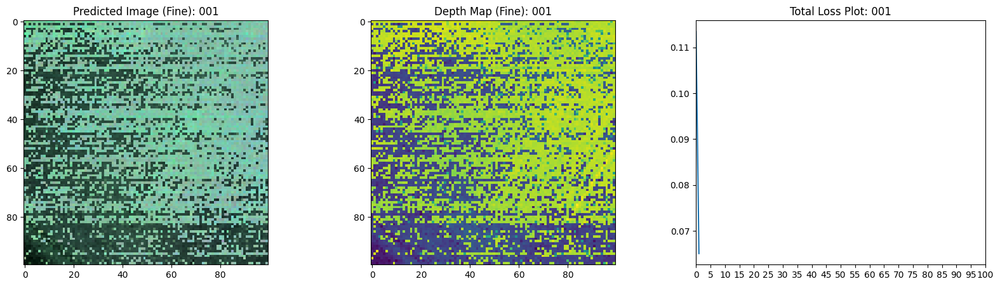

16/16 [==============================] - 11s 720ms/step - total_loss: 0.0651 - coarse_loss: 0.0651 - fine_loss: 0.0000e+00 - coarse_psnr: 12.3174 - fine_psnr: 8.3857 - val_total_loss: 0.2249 - val_coarse_loss: 0.0671 - val_fine_loss: 0.1578 - val_coarse_psnr: 12.1079 - val_fine_psnr: 8.0420
Epoch 3/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0589 - coarse_loss: 0.0589 - fine_loss: 0.0000e+00 - coarse_psnr: 12.7070 - fine_psnr: 8.3862

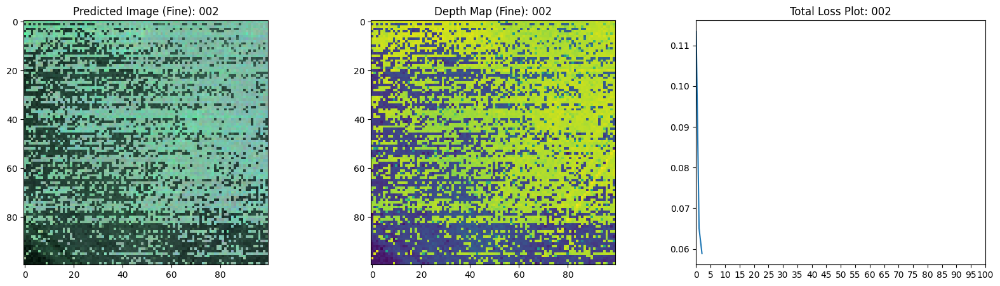

16/16 [==============================] - 11s 723ms/step - total_loss: 0.0589 - coarse_loss: 0.0589 - fine_loss: 0.0000e+00 - coarse_psnr: 12.7070 - fine_psnr: 8.3862 - val_total_loss: 0.2184 - val_coarse_loss: 0.0615 - val_fine_loss: 0.1569 - val_coarse_psnr: 12.4871 - val_fine_psnr: 8.0726
Epoch 4/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0566 - coarse_loss: 0.0566 - fine_loss: 0.0000e+00 - coarse_psnr: 12.8999 - fine_psnr: 8.3839

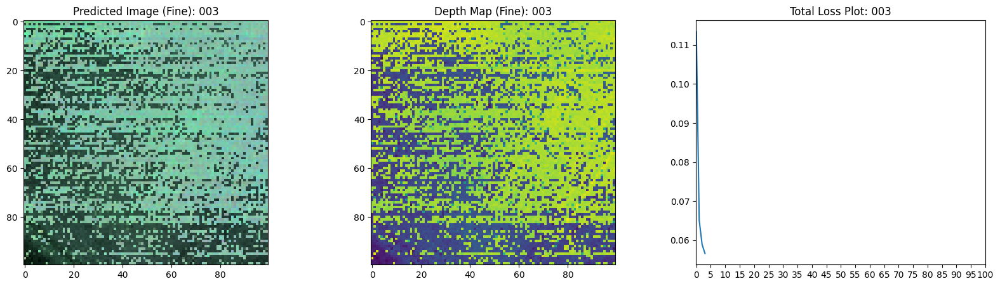

16/16 [==============================] - 12s 746ms/step - total_loss: 0.0566 - coarse_loss: 0.0566 - fine_loss: 0.0000e+00 - coarse_psnr: 12.8999 - fine_psnr: 8.3839 - val_total_loss: 0.2171 - val_coarse_loss: 0.0595 - val_fine_loss: 0.1577 - val_coarse_psnr: 12.6260 - val_fine_psnr: 8.0478
Epoch 5/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0502 - coarse_loss: 0.0502 - fine_loss: 0.0000e+00 - coarse_psnr: 13.4219 - fine_psnr: 8.3730

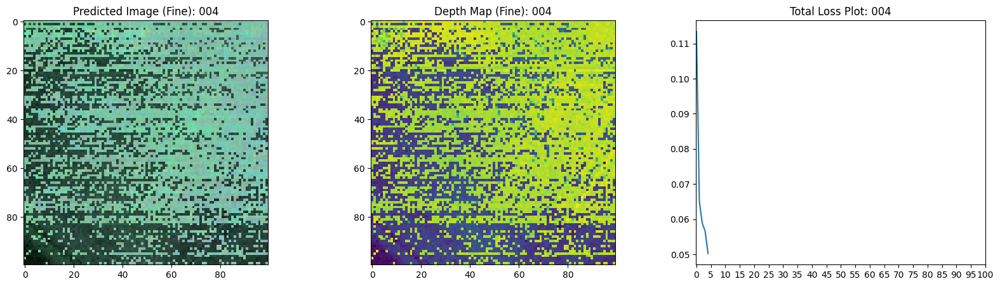

16/16 [==============================] - 12s 728ms/step - total_loss: 0.0502 - coarse_loss: 0.0502 - fine_loss: 0.0000e+00 - coarse_psnr: 13.4219 - fine_psnr: 8.3730 - val_total_loss: 0.2049 - val_coarse_loss: 0.0471 - val_fine_loss: 0.1578 - val_coarse_psnr: 13.6286 - val_fine_psnr: 8.0428
Epoch 6/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0394 - coarse_loss: 0.0394 - fine_loss: 0.0000e+00 - coarse_psnr: 14.4064 - fine_psnr: 8.3647

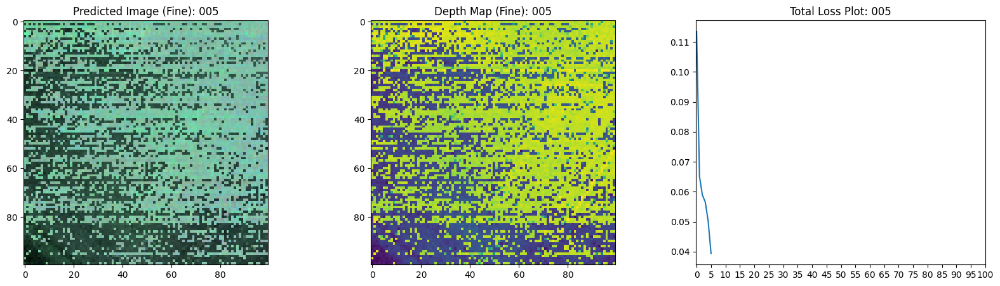

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0394 - coarse_loss: 0.0394 - fine_loss: 0.0000e+00 - coarse_psnr: 14.4064 - fine_psnr: 8.3647 - val_total_loss: 0.1907 - val_coarse_loss: 0.0351 - val_fine_loss: 0.1556 - val_coarse_psnr: 14.7395 - val_fine_psnr: 8.1055
Epoch 7/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0321 - coarse_loss: 0.0321 - fine_loss: 0.0000e+00 - coarse_psnr: 15.1835 - fine_psnr: 8.3686

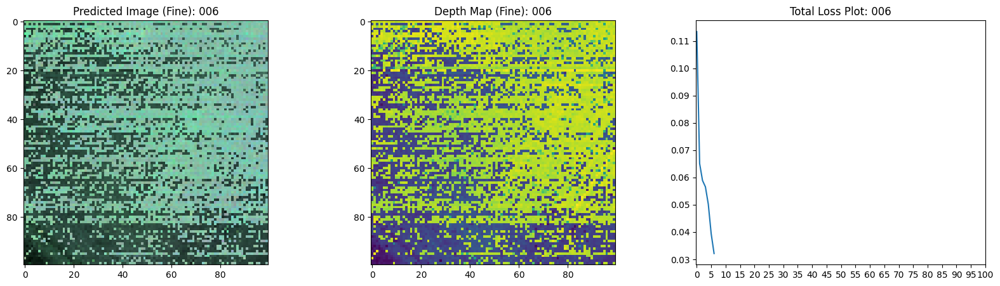

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0321 - coarse_loss: 0.0321 - fine_loss: 0.0000e+00 - coarse_psnr: 15.1835 - fine_psnr: 8.3686 - val_total_loss: 0.1875 - val_coarse_loss: 0.0313 - val_fine_loss: 0.1562 - val_coarse_psnr: 15.2499 - val_fine_psnr: 8.0894
Epoch 8/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0279 - coarse_loss: 0.0279 - fine_loss: 0.0000e+00 - coarse_psnr: 15.8234 - fine_psnr: 8.3809

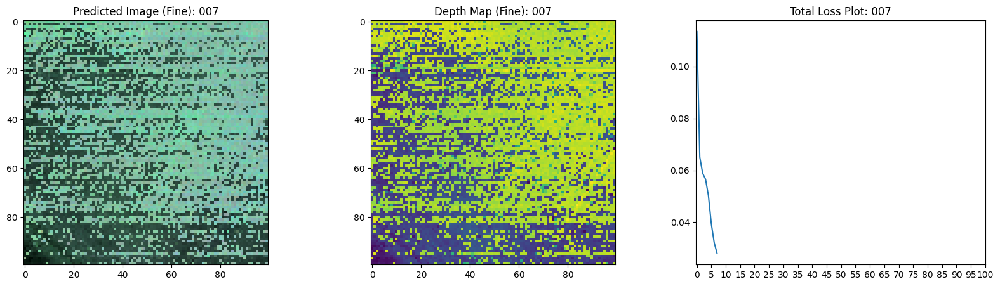

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0279 - coarse_loss: 0.0279 - fine_loss: 0.0000e+00 - coarse_psnr: 15.8234 - fine_psnr: 8.3809 - val_total_loss: 0.1854 - val_coarse_loss: 0.0281 - val_fine_loss: 0.1573 - val_coarse_psnr: 15.7247 - val_fine_psnr: 8.0586
Epoch 9/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0260 - coarse_loss: 0.0260 - fine_loss: 0.0000e+00 - coarse_psnr: 16.1286 - fine_psnr: 8.3866

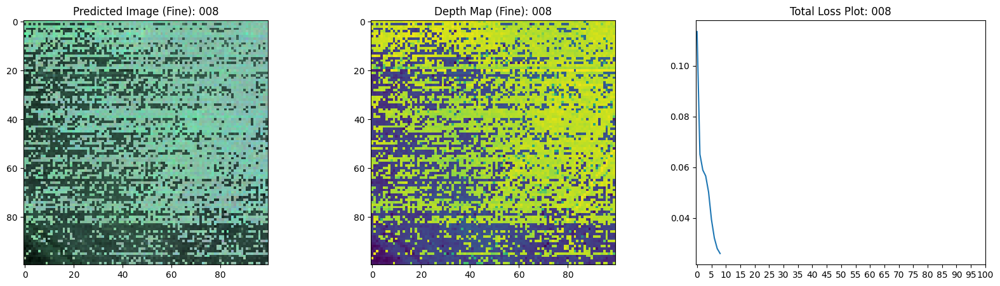

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0260 - coarse_loss: 0.0260 - fine_loss: 0.0000e+00 - coarse_psnr: 16.1286 - fine_psnr: 8.3866 - val_total_loss: 0.1818 - val_coarse_loss: 0.0255 - val_fine_loss: 0.1563 - val_coarse_psnr: 16.1560 - val_fine_psnr: 8.0885
Epoch 10/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0239 - coarse_loss: 0.0239 - fine_loss: 0.0000e+00 - coarse_psnr: 16.4664 - fine_psnr: 8.3823

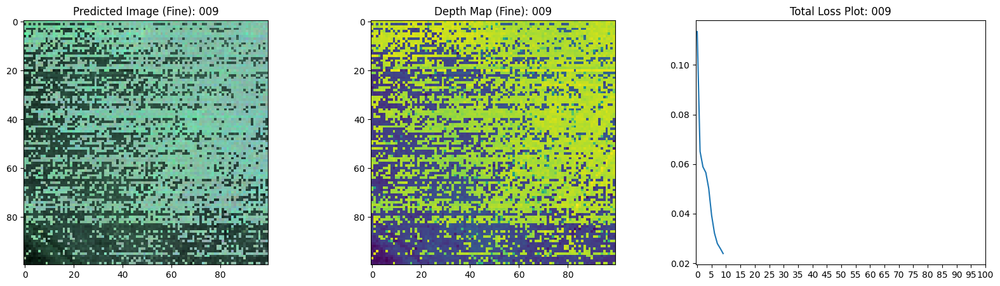

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0239 - coarse_loss: 0.0239 - fine_loss: 0.0000e+00 - coarse_psnr: 16.4664 - fine_psnr: 8.3823 - val_total_loss: 0.1815 - val_coarse_loss: 0.0232 - val_fine_loss: 0.1583 - val_coarse_psnr: 16.5519 - val_fine_psnr: 8.0317
Epoch 11/100
16/16 [==============================] - ETA: 0s - total_loss: 0.1044 - coarse_loss: 0.0214 - fine_loss: 0.0830 - coarse_psnr: 16.9551 - fine_psnr: 11.2432

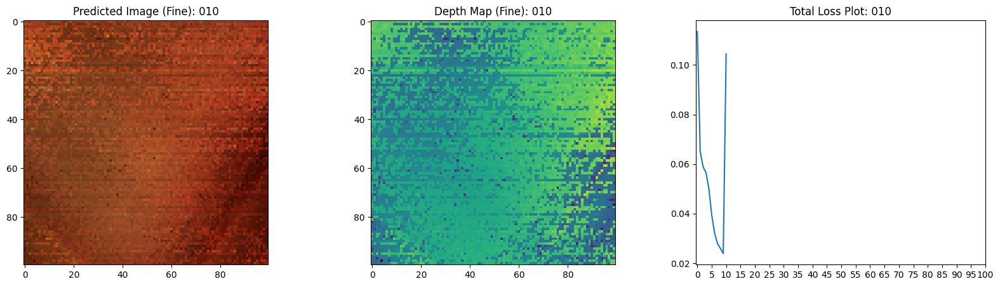

16/16 [==============================] - 12s 732ms/step - total_loss: 0.1044 - coarse_loss: 0.0214 - fine_loss: 0.0830 - coarse_psnr: 16.9551 - fine_psnr: 11.2432 - val_total_loss: 0.0958 - val_coarse_loss: 0.0206 - val_fine_loss: 0.0752 - val_coarse_psnr: 16.9972 - val_fine_psnr: 11.7448
Epoch 12/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0784 - coarse_loss: 0.0193 - fine_loss: 0.0591 - coarse_psnr: 17.3271 - fine_psnr: 12.6973

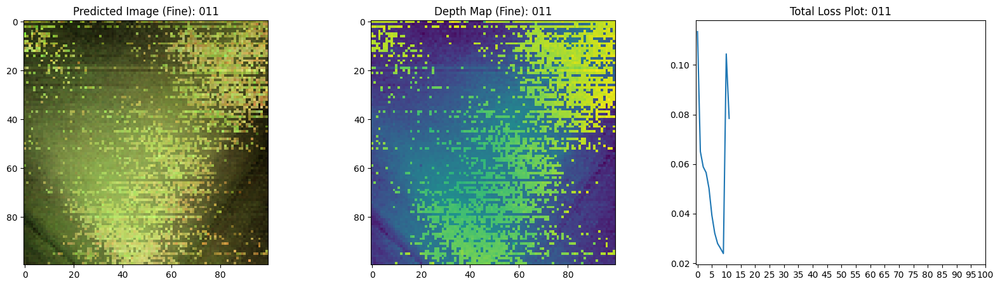

16/16 [==============================] - 12s 731ms/step - total_loss: 0.0784 - coarse_loss: 0.0193 - fine_loss: 0.0591 - coarse_psnr: 17.3271 - fine_psnr: 12.6973 - val_total_loss: 0.0806 - val_coarse_loss: 0.0180 - val_fine_loss: 0.0626 - val_coarse_psnr: 17.5704 - val_fine_psnr: 12.4213
Epoch 13/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0708 - coarse_loss: 0.0177 - fine_loss: 0.0531 - coarse_psnr: 17.6867 - fine_psnr: 13.1713

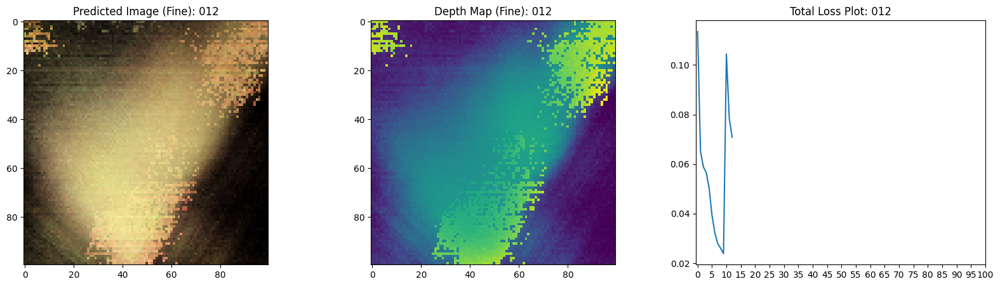

16/16 [==============================] - 12s 730ms/step - total_loss: 0.0708 - coarse_loss: 0.0177 - fine_loss: 0.0531 - coarse_psnr: 17.6867 - fine_psnr: 13.1713 - val_total_loss: 0.0703 - val_coarse_loss: 0.0171 - val_fine_loss: 0.0533 - val_coarse_psnr: 17.7461 - val_fine_psnr: 12.9638
Epoch 14/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0550 - coarse_loss: 0.0165 - fine_loss: 0.0385 - coarse_psnr: 17.9618 - fine_psnr: 14.5315

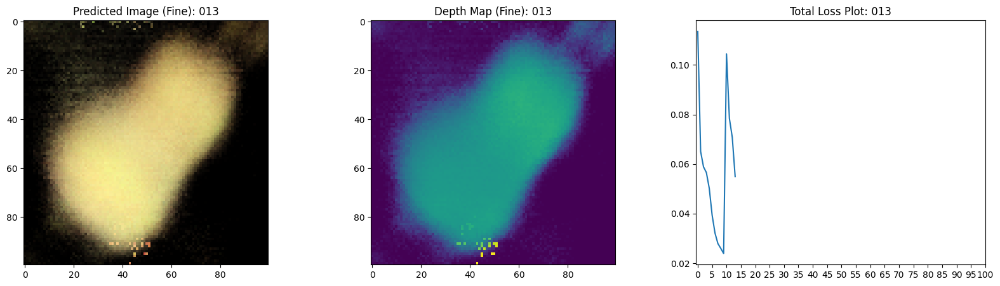

16/16 [==============================] - 12s 729ms/step - total_loss: 0.0550 - coarse_loss: 0.0165 - fine_loss: 0.0385 - coarse_psnr: 17.9618 - fine_psnr: 14.5315 - val_total_loss: 0.0502 - val_coarse_loss: 0.0154 - val_fine_loss: 0.0348 - val_coarse_psnr: 18.2266 - val_fine_psnr: 14.7238
Epoch 15/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0466 - coarse_loss: 0.0153 - fine_loss: 0.0313 - coarse_psnr: 18.2831 - fine_psnr: 15.2653

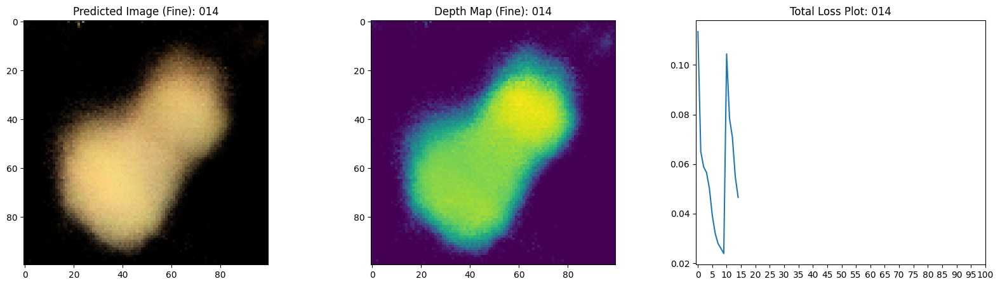

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0466 - coarse_loss: 0.0153 - fine_loss: 0.0313 - coarse_psnr: 18.2831 - fine_psnr: 15.2653 - val_total_loss: 0.0459 - val_coarse_loss: 0.0150 - val_fine_loss: 0.0309 - val_coarse_psnr: 18.3354 - val_fine_psnr: 15.2889
Epoch 16/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0424 - coarse_loss: 0.0144 - fine_loss: 0.0279 - coarse_psnr: 18.5500 - fine_psnr: 15.7402

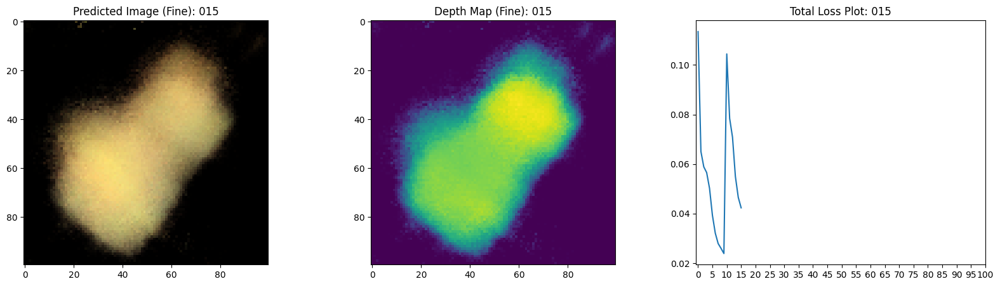

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0424 - coarse_loss: 0.0144 - fine_loss: 0.0279 - coarse_psnr: 18.5500 - fine_psnr: 15.7402 - val_total_loss: 0.0427 - val_coarse_loss: 0.0141 - val_fine_loss: 0.0286 - val_coarse_psnr: 18.5700 - val_fine_psnr: 15.5613
Epoch 17/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0394 - coarse_loss: 0.0137 - fine_loss: 0.0257 - coarse_psnr: 18.7842 - fine_psnr: 16.1206

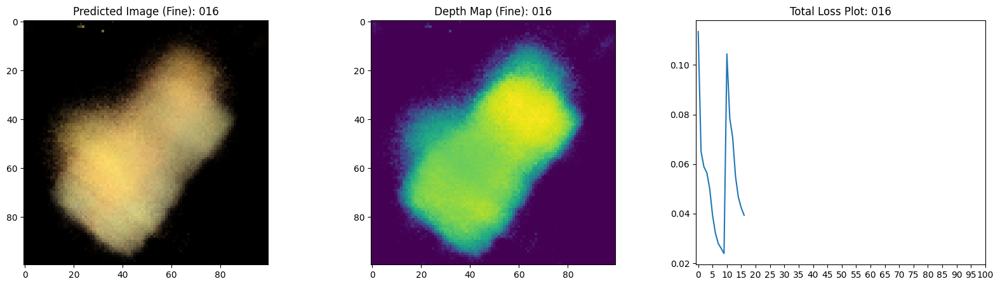

16/16 [==============================] - 12s 752ms/step - total_loss: 0.0394 - coarse_loss: 0.0137 - fine_loss: 0.0257 - coarse_psnr: 18.7842 - fine_psnr: 16.1206 - val_total_loss: 0.0391 - val_coarse_loss: 0.0136 - val_fine_loss: 0.0255 - val_coarse_psnr: 18.7479 - val_fine_psnr: 16.0850
Epoch 18/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0368 - coarse_loss: 0.0138 - fine_loss: 0.0230 - coarse_psnr: 18.7373 - fine_psnr: 16.5647

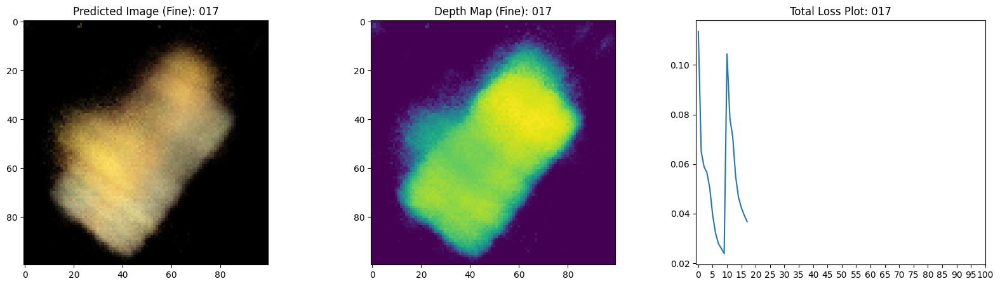

16/16 [==============================] - 12s 728ms/step - total_loss: 0.0368 - coarse_loss: 0.0138 - fine_loss: 0.0230 - coarse_psnr: 18.7373 - fine_psnr: 16.5647 - val_total_loss: 0.0348 - val_coarse_loss: 0.0131 - val_fine_loss: 0.0218 - val_coarse_psnr: 18.9329 - val_fine_psnr: 16.7646
Epoch 19/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0325 - coarse_loss: 0.0131 - fine_loss: 0.0193 - coarse_psnr: 18.9719 - fine_psnr: 17.2861

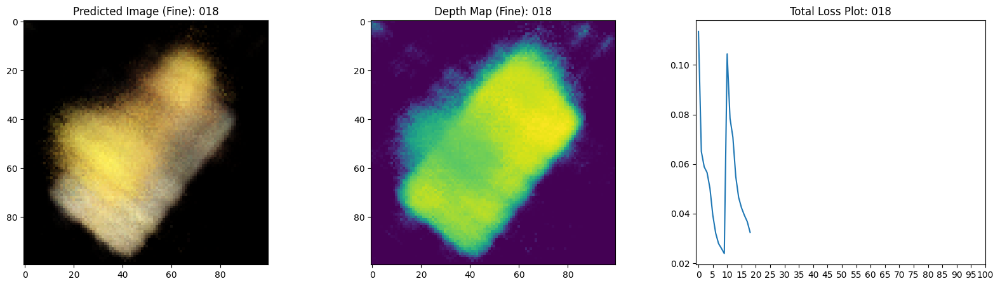

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0325 - coarse_loss: 0.0131 - fine_loss: 0.0193 - coarse_psnr: 18.9719 - fine_psnr: 17.2861 - val_total_loss: 0.0314 - val_coarse_loss: 0.0123 - val_fine_loss: 0.0191 - val_coarse_psnr: 19.1879 - val_fine_psnr: 17.2529
Epoch 20/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0313 - coarse_loss: 0.0126 - fine_loss: 0.0187 - coarse_psnr: 19.1433 - fine_psnr: 17.4713

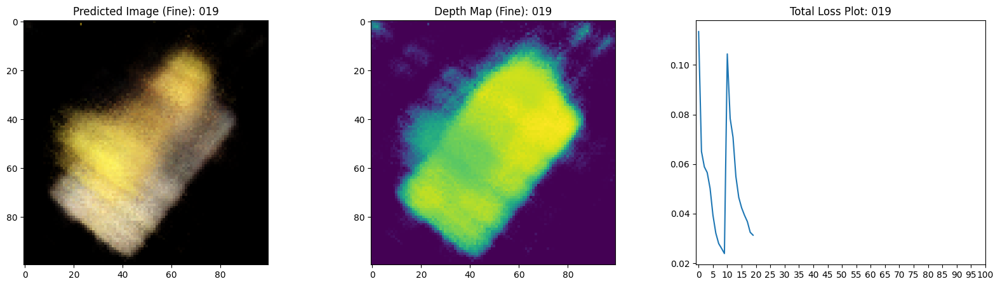

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0313 - coarse_loss: 0.0126 - fine_loss: 0.0187 - coarse_psnr: 19.1433 - fine_psnr: 17.4713 - val_total_loss: 0.0280 - val_coarse_loss: 0.0118 - val_fine_loss: 0.0163 - val_coarse_psnr: 19.3982 - val_fine_psnr: 17.9593
Epoch 21/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0273 - coarse_loss: 0.0117 - fine_loss: 0.0156 - coarse_psnr: 19.4544 - fine_psnr: 18.2023

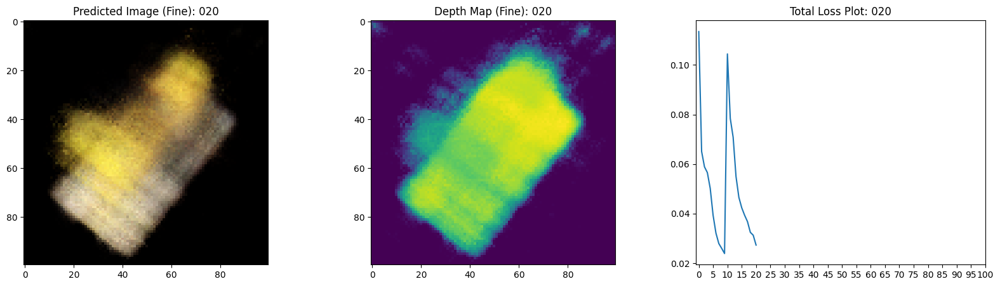

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0273 - coarse_loss: 0.0117 - fine_loss: 0.0156 - coarse_psnr: 19.4544 - fine_psnr: 18.2023 - val_total_loss: 0.0262 - val_coarse_loss: 0.0115 - val_fine_loss: 0.0147 - val_coarse_psnr: 19.5359 - val_fine_psnr: 18.4344
Epoch 22/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0257 - coarse_loss: 0.0114 - fine_loss: 0.0142 - coarse_psnr: 19.5568 - fine_psnr: 18.6026

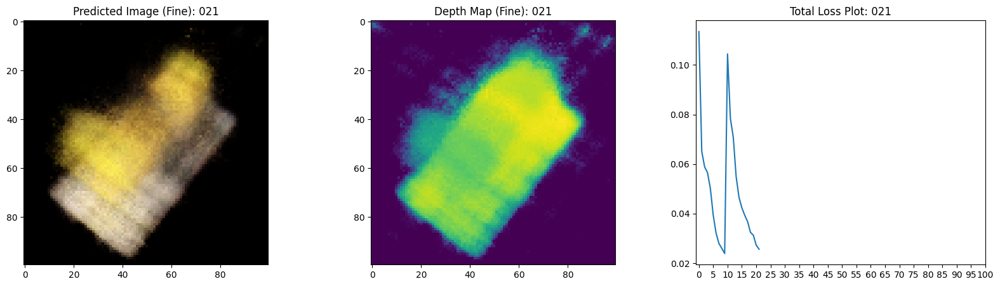

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0257 - coarse_loss: 0.0114 - fine_loss: 0.0142 - coarse_psnr: 19.5568 - fine_psnr: 18.6026 - val_total_loss: 0.0241 - val_coarse_loss: 0.0110 - val_fine_loss: 0.0131 - val_coarse_psnr: 19.6759 - val_fine_psnr: 18.9137
Epoch 23/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0245 - coarse_loss: 0.0114 - fine_loss: 0.0131 - coarse_psnr: 19.5766 - fine_psnr: 18.9605

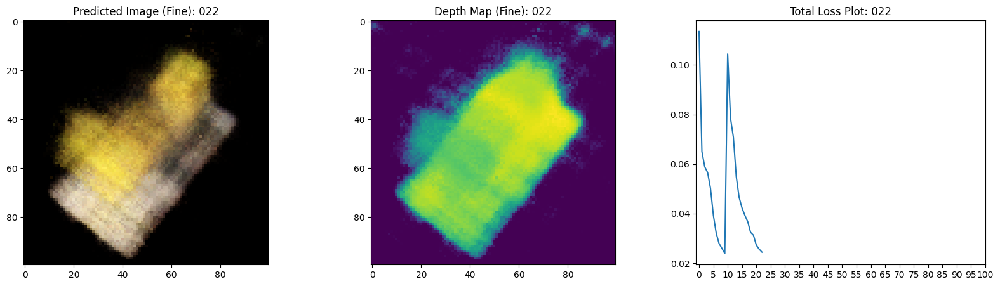

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0245 - coarse_loss: 0.0114 - fine_loss: 0.0131 - coarse_psnr: 19.5766 - fine_psnr: 18.9605 - val_total_loss: 0.0234 - val_coarse_loss: 0.0108 - val_fine_loss: 0.0127 - val_coarse_psnr: 19.8083 - val_fine_psnr: 19.1242
Epoch 24/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0227 - coarse_loss: 0.0107 - fine_loss: 0.0120 - coarse_psnr: 19.8578 - fine_psnr: 19.3436

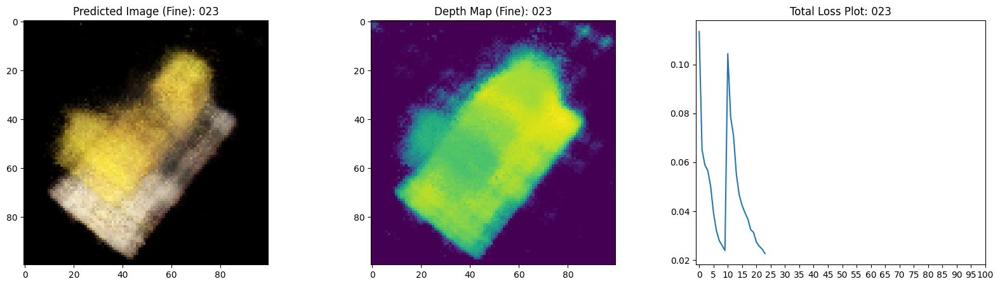

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0227 - coarse_loss: 0.0107 - fine_loss: 0.0120 - coarse_psnr: 19.8578 - fine_psnr: 19.3436 - val_total_loss: 0.0220 - val_coarse_loss: 0.0104 - val_fine_loss: 0.0116 - val_coarse_psnr: 19.9632 - val_fine_psnr: 19.4266
Epoch 25/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0220 - coarse_loss: 0.0105 - fine_loss: 0.0115 - coarse_psnr: 19.9188 - fine_psnr: 19.5344

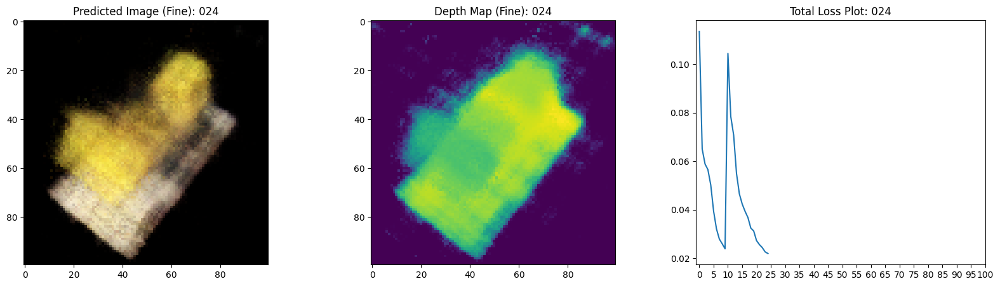

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0220 - coarse_loss: 0.0105 - fine_loss: 0.0115 - coarse_psnr: 19.9188 - fine_psnr: 19.5344 - val_total_loss: 0.0214 - val_coarse_loss: 0.0104 - val_fine_loss: 0.0111 - val_coarse_psnr: 19.9122 - val_fine_psnr: 19.6218
Epoch 26/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0214 - coarse_loss: 0.0105 - fine_loss: 0.0109 - coarse_psnr: 19.9487 - fine_psnr: 19.7479

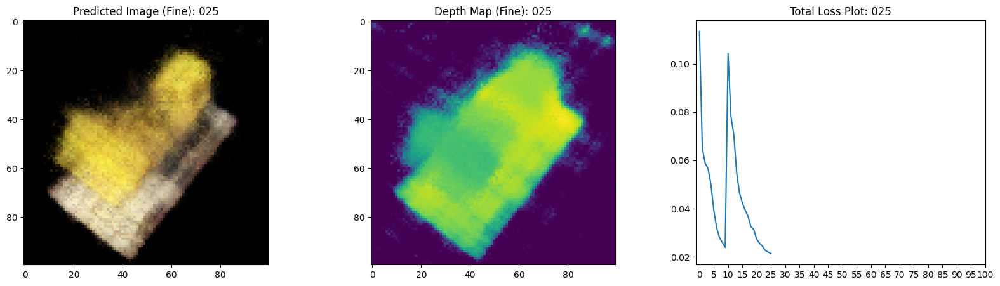

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0214 - coarse_loss: 0.0105 - fine_loss: 0.0109 - coarse_psnr: 19.9487 - fine_psnr: 19.7479 - val_total_loss: 0.0209 - val_coarse_loss: 0.0102 - val_fine_loss: 0.0107 - val_coarse_psnr: 19.9752 - val_fine_psnr: 19.7592
Epoch 27/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0207 - coarse_loss: 0.0102 - fine_loss: 0.0105 - coarse_psnr: 20.0448 - fine_psnr: 19.9338

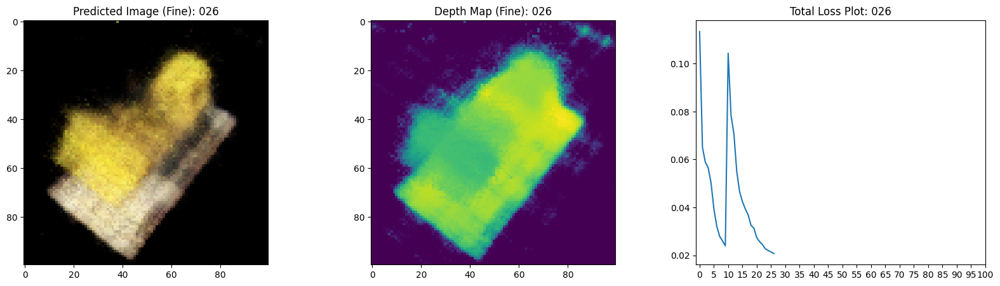

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0207 - coarse_loss: 0.0102 - fine_loss: 0.0105 - coarse_psnr: 20.0448 - fine_psnr: 19.9338 - val_total_loss: 0.0197 - val_coarse_loss: 0.0096 - val_fine_loss: 0.0101 - val_coarse_psnr: 20.2997 - val_fine_psnr: 20.0347
Epoch 28/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0202 - coarse_loss: 0.0100 - fine_loss: 0.0102 - coarse_psnr: 20.1435 - fine_psnr: 20.0602

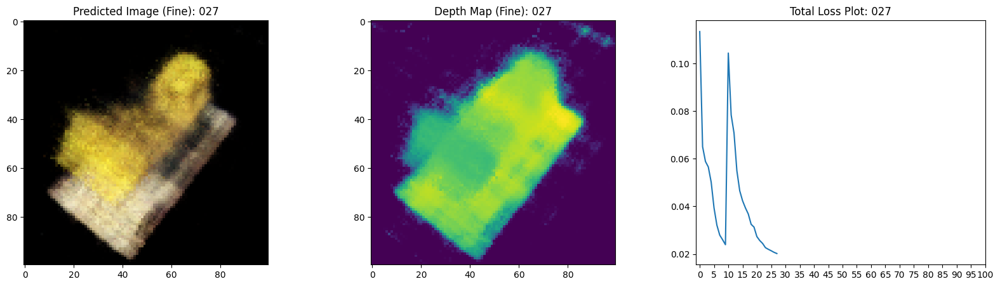

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0202 - coarse_loss: 0.0100 - fine_loss: 0.0102 - coarse_psnr: 20.1435 - fine_psnr: 20.0602 - val_total_loss: 0.0196 - val_coarse_loss: 0.0097 - val_fine_loss: 0.0099 - val_coarse_psnr: 20.2369 - val_fine_psnr: 20.1681
Epoch 29/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0189 - coarse_loss: 0.0095 - fine_loss: 0.0094 - coarse_psnr: 20.3836 - fine_psnr: 20.4015

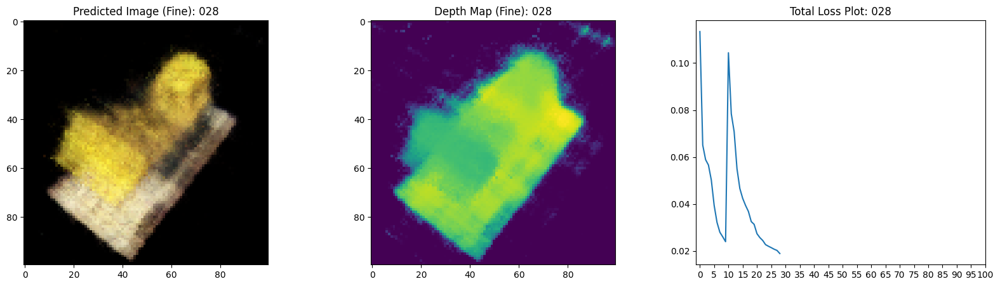

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0189 - coarse_loss: 0.0095 - fine_loss: 0.0094 - coarse_psnr: 20.3836 - fine_psnr: 20.4015 - val_total_loss: 0.0181 - val_coarse_loss: 0.0090 - val_fine_loss: 0.0091 - val_coarse_psnr: 20.5638 - val_fine_psnr: 20.5488
Epoch 30/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0188 - coarse_loss: 0.0095 - fine_loss: 0.0093 - coarse_psnr: 20.3760 - fine_psnr: 20.4646

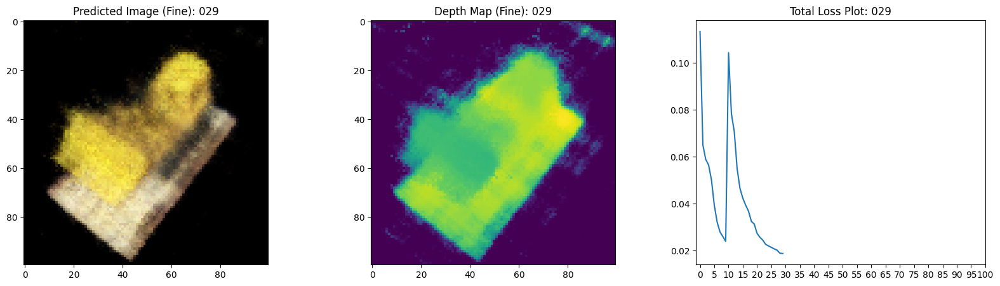

16/16 [==============================] - 12s 746ms/step - total_loss: 0.0188 - coarse_loss: 0.0095 - fine_loss: 0.0093 - coarse_psnr: 20.3760 - fine_psnr: 20.4646 - val_total_loss: 0.0177 - val_coarse_loss: 0.0087 - val_fine_loss: 0.0090 - val_coarse_psnr: 20.6903 - val_fine_psnr: 20.5200
Epoch 31/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0185 - coarse_loss: 0.0094 - fine_loss: 0.0091 - coarse_psnr: 20.4141 - fine_psnr: 20.5530

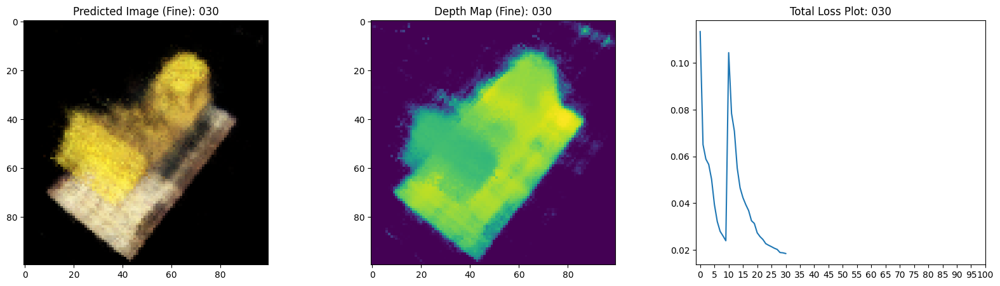

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0185 - coarse_loss: 0.0094 - fine_loss: 0.0091 - coarse_psnr: 20.4141 - fine_psnr: 20.5530 - val_total_loss: 0.0174 - val_coarse_loss: 0.0088 - val_fine_loss: 0.0086 - val_coarse_psnr: 20.7081 - val_fine_psnr: 20.7973
Epoch 32/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0176 - coarse_loss: 0.0090 - fine_loss: 0.0086 - coarse_psnr: 20.6058 - fine_psnr: 20.7837

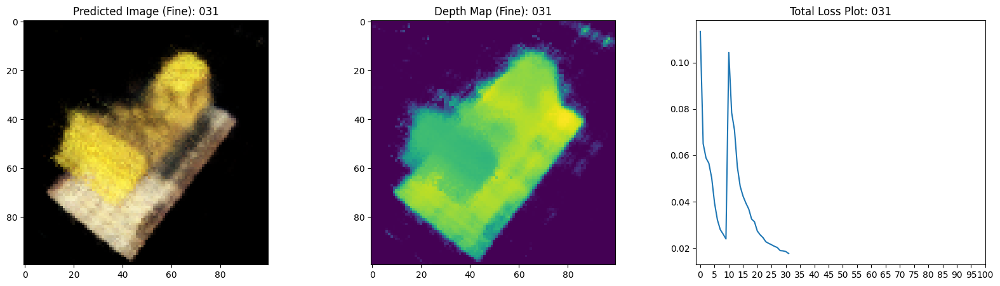

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0176 - coarse_loss: 0.0090 - fine_loss: 0.0086 - coarse_psnr: 20.6058 - fine_psnr: 20.7837 - val_total_loss: 0.0173 - val_coarse_loss: 0.0089 - val_fine_loss: 0.0085 - val_coarse_psnr: 20.5899 - val_fine_psnr: 20.7735
Epoch 33/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0175 - coarse_loss: 0.0090 - fine_loss: 0.0085 - coarse_psnr: 20.6081 - fine_psnr: 20.8503

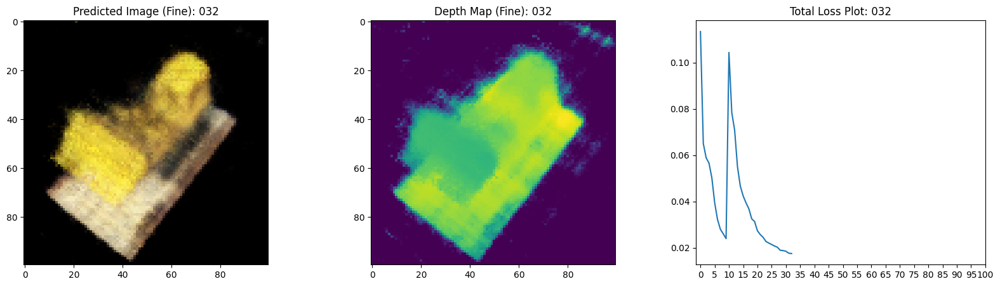

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0175 - coarse_loss: 0.0090 - fine_loss: 0.0085 - coarse_psnr: 20.6081 - fine_psnr: 20.8503 - val_total_loss: 0.0166 - val_coarse_loss: 0.0084 - val_fine_loss: 0.0082 - val_coarse_psnr: 20.8863 - val_fine_psnr: 20.9513
Epoch 34/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0172 - coarse_loss: 0.0088 - fine_loss: 0.0083 - coarse_psnr: 20.6887 - fine_psnr: 20.9401

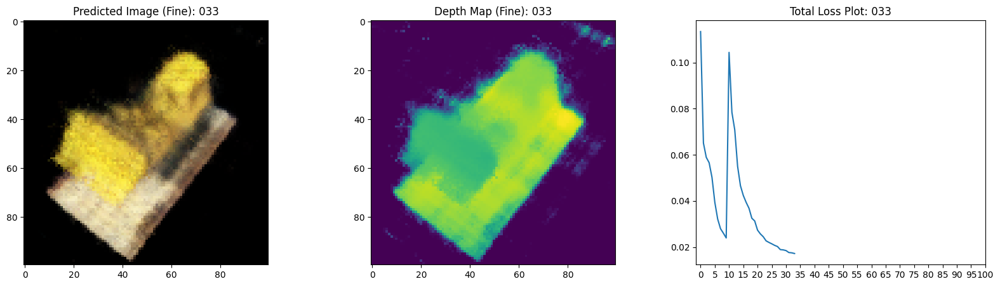

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0172 - coarse_loss: 0.0088 - fine_loss: 0.0083 - coarse_psnr: 20.6887 - fine_psnr: 20.9401 - val_total_loss: 0.0163 - val_coarse_loss: 0.0082 - val_fine_loss: 0.0081 - val_coarse_psnr: 20.9823 - val_fine_psnr: 21.0482
Epoch 35/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0167 - coarse_loss: 0.0085 - fine_loss: 0.0082 - coarse_psnr: 20.8356 - fine_psnr: 21.0272

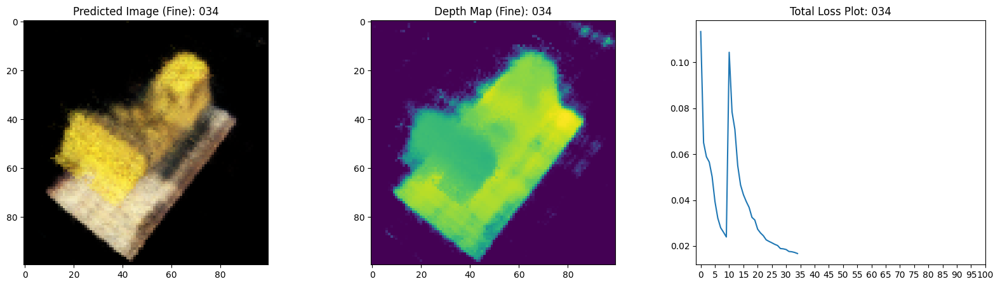

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0167 - coarse_loss: 0.0085 - fine_loss: 0.0082 - coarse_psnr: 20.8356 - fine_psnr: 21.0272 - val_total_loss: 0.0158 - val_coarse_loss: 0.0081 - val_fine_loss: 0.0077 - val_coarse_psnr: 21.0402 - val_fine_psnr: 21.2692
Epoch 36/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0162 - coarse_loss: 0.0084 - fine_loss: 0.0078 - coarse_psnr: 20.9085 - fine_psnr: 21.2401

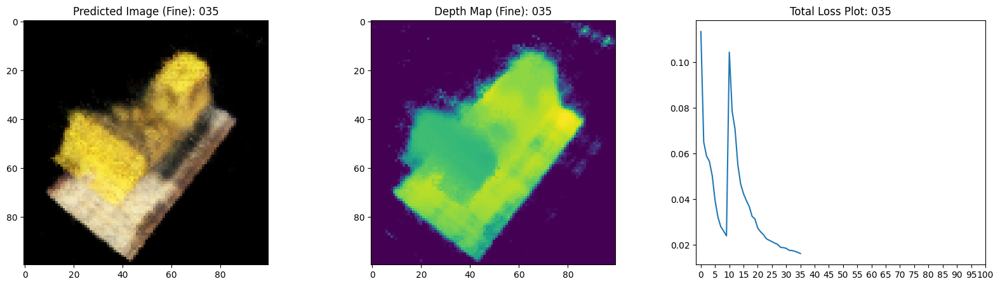

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0162 - coarse_loss: 0.0084 - fine_loss: 0.0078 - coarse_psnr: 20.9085 - fine_psnr: 21.2401 - val_total_loss: 0.0161 - val_coarse_loss: 0.0083 - val_fine_loss: 0.0078 - val_coarse_psnr: 20.8951 - val_fine_psnr: 21.1856
Epoch 37/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0162 - coarse_loss: 0.0084 - fine_loss: 0.0078 - coarse_psnr: 20.8849 - fine_psnr: 21.2728

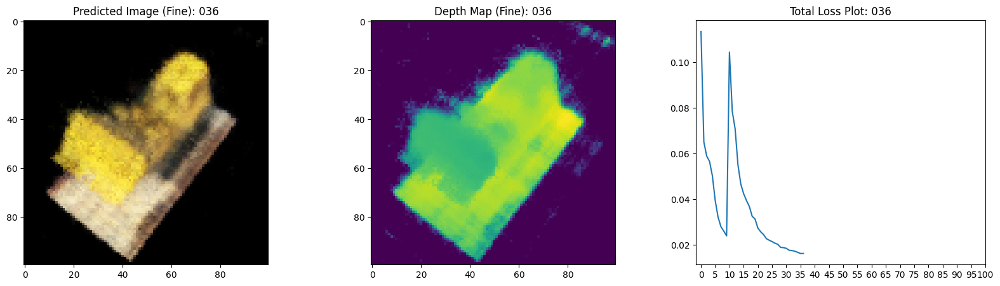

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0162 - coarse_loss: 0.0084 - fine_loss: 0.0078 - coarse_psnr: 20.8849 - fine_psnr: 21.2728 - val_total_loss: 0.0156 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0076 - val_coarse_psnr: 21.0880 - val_fine_psnr: 21.3087
Epoch 38/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0157 - coarse_loss: 0.0081 - fine_loss: 0.0076 - coarse_psnr: 21.0458 - fine_psnr: 21.3568

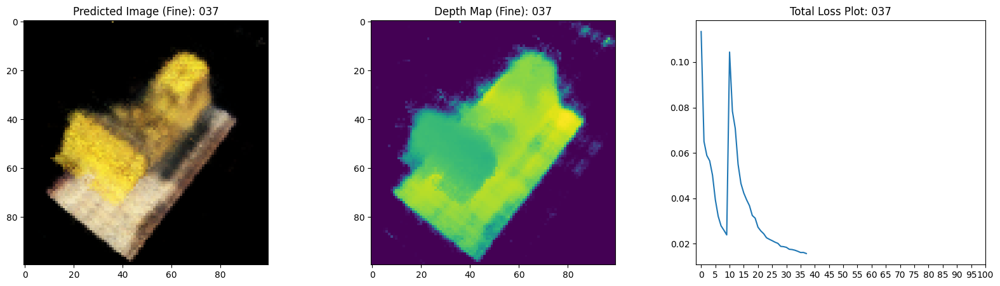

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0157 - coarse_loss: 0.0081 - fine_loss: 0.0076 - coarse_psnr: 21.0458 - fine_psnr: 21.3568 - val_total_loss: 0.0155 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0074 - val_coarse_psnr: 21.1052 - val_fine_psnr: 21.4531
Epoch 39/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0153 - coarse_loss: 0.0080 - fine_loss: 0.0073 - coarse_psnr: 21.1262 - fine_psnr: 21.5533

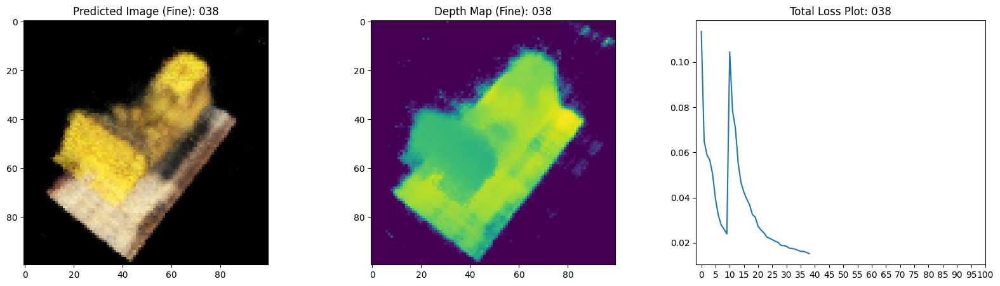

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0153 - coarse_loss: 0.0080 - fine_loss: 0.0073 - coarse_psnr: 21.1262 - fine_psnr: 21.5533 - val_total_loss: 0.0153 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0073 - val_coarse_psnr: 21.0773 - val_fine_psnr: 21.4503
Epoch 40/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0151 - coarse_loss: 0.0079 - fine_loss: 0.0072 - coarse_psnr: 21.1439 - fine_psnr: 21.6101

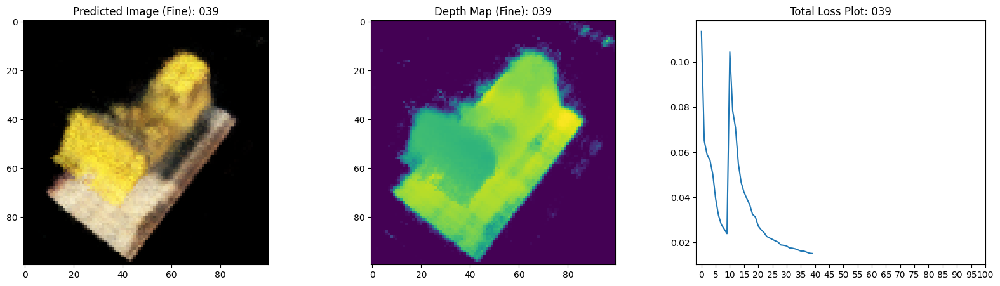

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0151 - coarse_loss: 0.0079 - fine_loss: 0.0072 - coarse_psnr: 21.1439 - fine_psnr: 21.6101 - val_total_loss: 0.0148 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.2560 - val_fine_psnr: 21.5986
Epoch 41/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0149 - coarse_loss: 0.0078 - fine_loss: 0.0071 - coarse_psnr: 21.1934 - fine_psnr: 21.6501

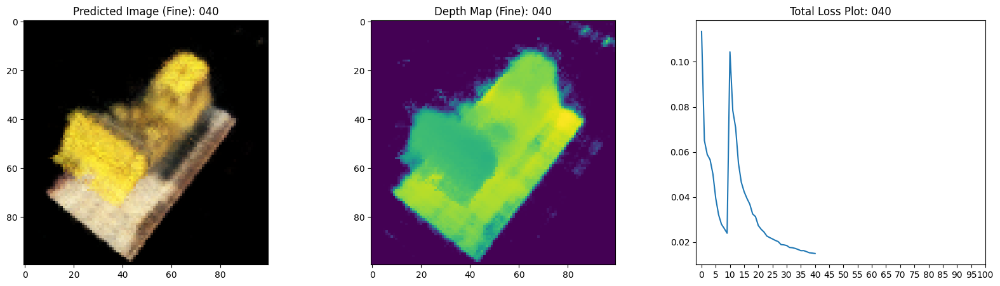

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0149 - coarse_loss: 0.0078 - fine_loss: 0.0071 - coarse_psnr: 21.1934 - fine_psnr: 21.6501 - val_total_loss: 0.0149 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0072 - val_coarse_psnr: 21.2022 - val_fine_psnr: 21.5037
Epoch 42/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0149 - coarse_loss: 0.0078 - fine_loss: 0.0070 - coarse_psnr: 21.2050 - fine_psnr: 21.6759

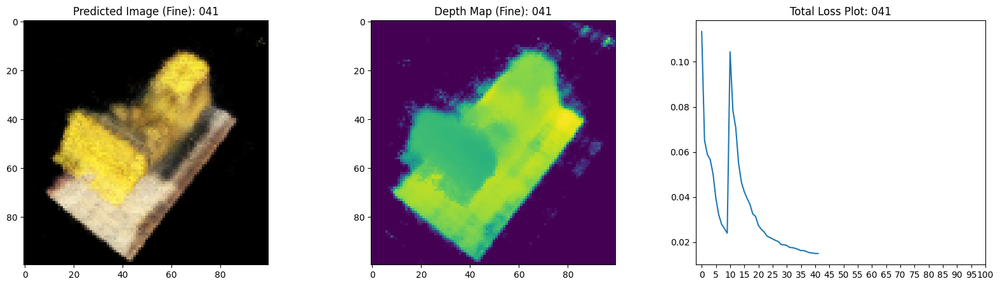

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0149 - coarse_loss: 0.0078 - fine_loss: 0.0070 - coarse_psnr: 21.2050 - fine_psnr: 21.6759 - val_total_loss: 0.0147 - val_coarse_loss: 0.0075 - val_fine_loss: 0.0073 - val_coarse_psnr: 21.3934 - val_fine_psnr: 21.4911
Epoch 43/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0147 - coarse_loss: 0.0077 - fine_loss: 0.0070 - coarse_psnr: 21.2562 - fine_psnr: 21.7234

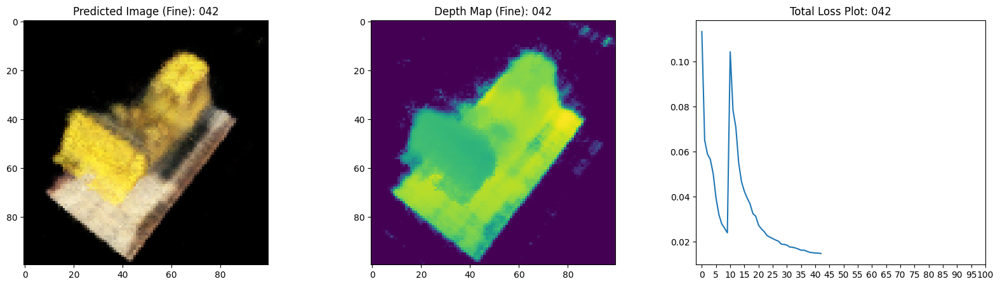

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0147 - coarse_loss: 0.0077 - fine_loss: 0.0070 - coarse_psnr: 21.2562 - fine_psnr: 21.7234 - val_total_loss: 0.0146 - val_coarse_loss: 0.0075 - val_fine_loss: 0.0070 - val_coarse_psnr: 21.3167 - val_fine_psnr: 21.5963
Epoch 44/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0143 - coarse_loss: 0.0075 - fine_loss: 0.0068 - coarse_psnr: 21.3981 - fine_psnr: 21.8264

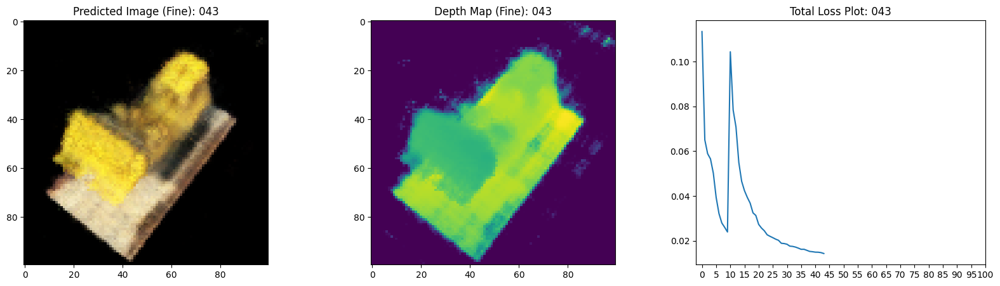

16/16 [==============================] - 12s 749ms/step - total_loss: 0.0143 - coarse_loss: 0.0075 - fine_loss: 0.0068 - coarse_psnr: 21.3981 - fine_psnr: 21.8264 - val_total_loss: 0.0142 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0069 - val_coarse_psnr: 21.4914 - val_fine_psnr: 21.7576
Epoch 45/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0140 - coarse_loss: 0.0074 - fine_loss: 0.0067 - coarse_psnr: 21.4754 - fine_psnr: 21.9305

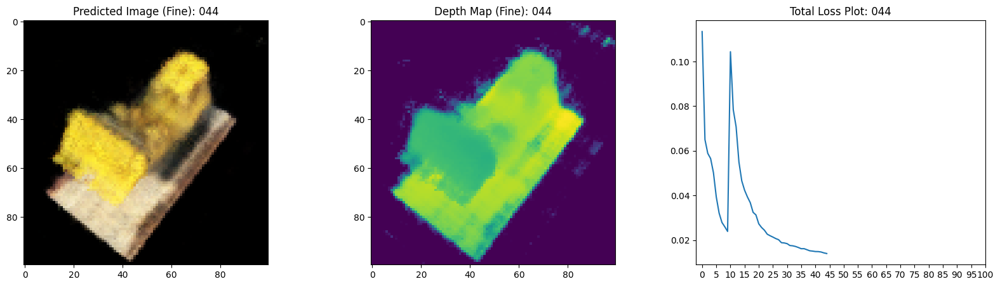

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0140 - coarse_loss: 0.0074 - fine_loss: 0.0067 - coarse_psnr: 21.4754 - fine_psnr: 21.9305 - val_total_loss: 0.0143 - val_coarse_loss: 0.0074 - val_fine_loss: 0.0069 - val_coarse_psnr: 21.3730 - val_fine_psnr: 21.7161
Epoch 46/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0140 - coarse_loss: 0.0074 - fine_loss: 0.0066 - coarse_psnr: 21.4779 - fine_psnr: 21.9384

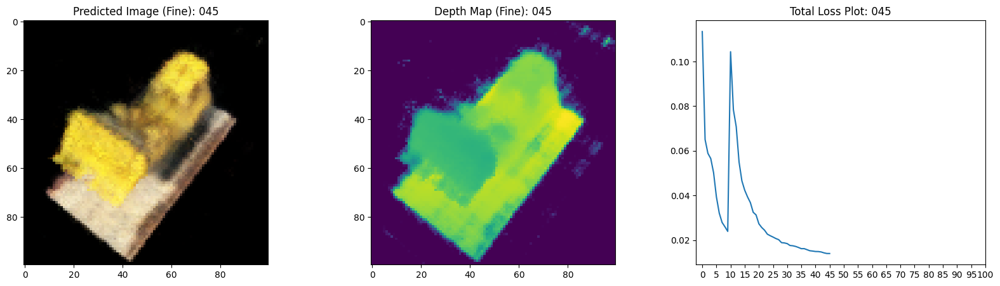

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0140 - coarse_loss: 0.0074 - fine_loss: 0.0066 - coarse_psnr: 21.4779 - fine_psnr: 21.9384 - val_total_loss: 0.0143 - val_coarse_loss: 0.0074 - val_fine_loss: 0.0069 - val_coarse_psnr: 21.3984 - val_fine_psnr: 21.7007
Epoch 47/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0142 - coarse_loss: 0.0074 - fine_loss: 0.0067 - coarse_psnr: 21.4274 - fine_psnr: 21.8664

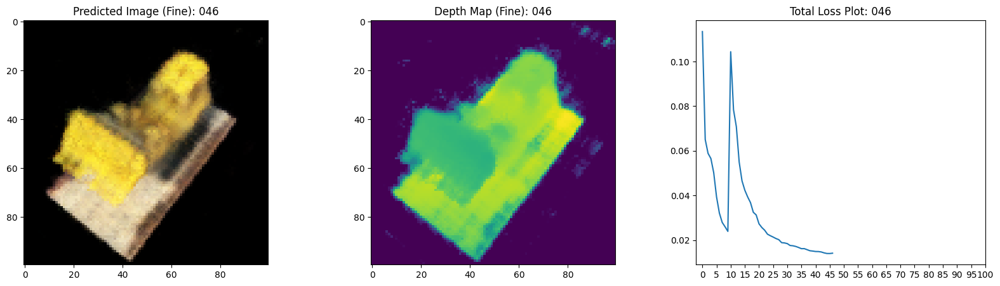

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0142 - coarse_loss: 0.0074 - fine_loss: 0.0067 - coarse_psnr: 21.4274 - fine_psnr: 21.8664 - val_total_loss: 0.0136 - val_coarse_loss: 0.0071 - val_fine_loss: 0.0065 - val_coarse_psnr: 21.6194 - val_fine_psnr: 21.9871
Epoch 48/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0138 - coarse_loss: 0.0073 - fine_loss: 0.0065 - coarse_psnr: 21.5271 - fine_psnr: 22.0285

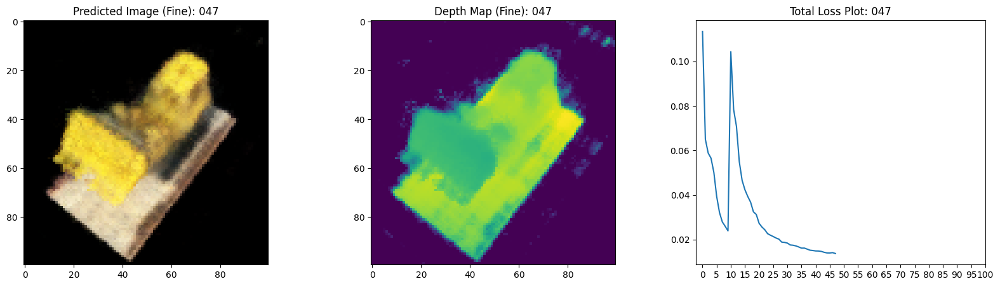

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0138 - coarse_loss: 0.0073 - fine_loss: 0.0065 - coarse_psnr: 21.5271 - fine_psnr: 22.0285 - val_total_loss: 0.0141 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0068 - val_coarse_psnr: 21.4821 - val_fine_psnr: 21.7448
Epoch 49/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0137 - coarse_loss: 0.0072 - fine_loss: 0.0065 - coarse_psnr: 21.5632 - fine_psnr: 22.0542

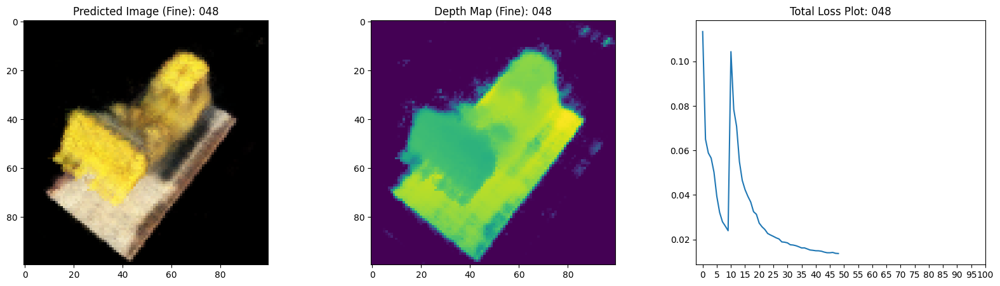

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0137 - coarse_loss: 0.0072 - fine_loss: 0.0065 - coarse_psnr: 21.5632 - fine_psnr: 22.0542 - val_total_loss: 0.0137 - val_coarse_loss: 0.0070 - val_fine_loss: 0.0067 - val_coarse_psnr: 21.6572 - val_fine_psnr: 21.7813
Epoch 50/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0135 - coarse_loss: 0.0071 - fine_loss: 0.0065 - coarse_psnr: 21.6372 - fine_psnr: 22.0208

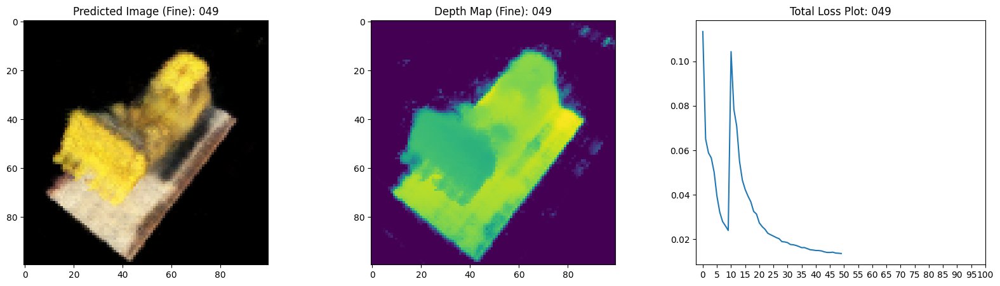

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0135 - coarse_loss: 0.0071 - fine_loss: 0.0065 - coarse_psnr: 21.6372 - fine_psnr: 22.0208 - val_total_loss: 0.0131 - val_coarse_loss: 0.0068 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.8079 - val_fine_psnr: 22.0768
Epoch 51/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0132 - coarse_loss: 0.0069 - fine_loss: 0.0063 - coarse_psnr: 21.7354 - fine_psnr: 22.1591

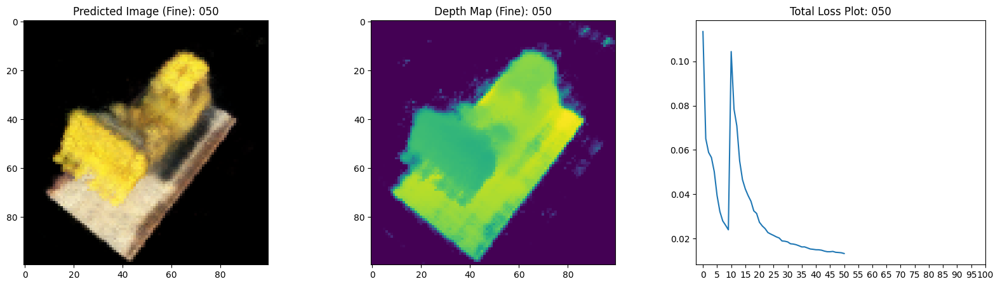

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0132 - coarse_loss: 0.0069 - fine_loss: 0.0063 - coarse_psnr: 21.7354 - fine_psnr: 22.1591 - val_total_loss: 0.0135 - val_coarse_loss: 0.0069 - val_fine_loss: 0.0066 - val_coarse_psnr: 21.6927 - val_fine_psnr: 21.8726
Epoch 52/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0133 - coarse_loss: 0.0070 - fine_loss: 0.0064 - coarse_psnr: 21.7176 - fine_psnr: 22.0885

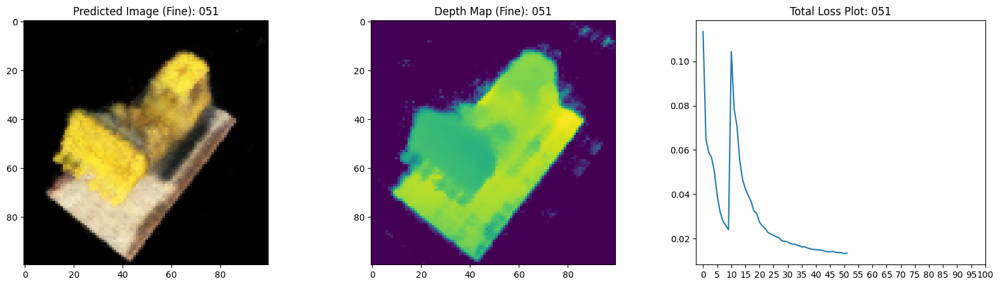

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0133 - coarse_loss: 0.0070 - fine_loss: 0.0064 - coarse_psnr: 21.7176 - fine_psnr: 22.0885 - val_total_loss: 0.0132 - val_coarse_loss: 0.0068 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.7894 - val_fine_psnr: 22.0346
Epoch 53/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0132 - coarse_loss: 0.0069 - fine_loss: 0.0063 - coarse_psnr: 21.7250 - fine_psnr: 22.1505

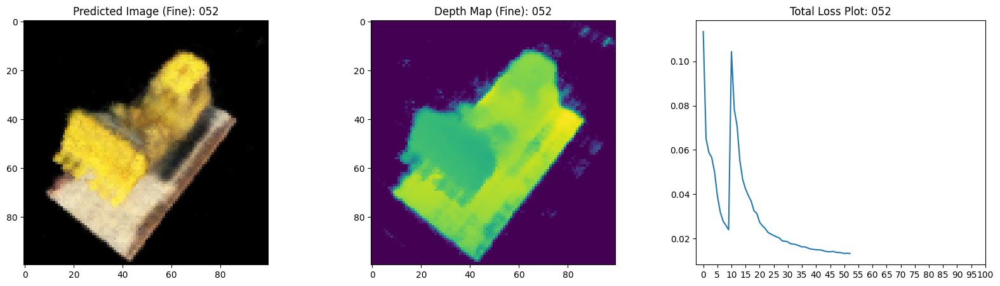

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0132 - coarse_loss: 0.0069 - fine_loss: 0.0063 - coarse_psnr: 21.7250 - fine_psnr: 22.1505 - val_total_loss: 0.0131 - val_coarse_loss: 0.0067 - val_fine_loss: 0.0063 - val_coarse_psnr: 21.8396 - val_fine_psnr: 22.0808
Epoch 54/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0130 - coarse_loss: 0.0067 - fine_loss: 0.0063 - coarse_psnr: 21.8424 - fine_psnr: 22.1787

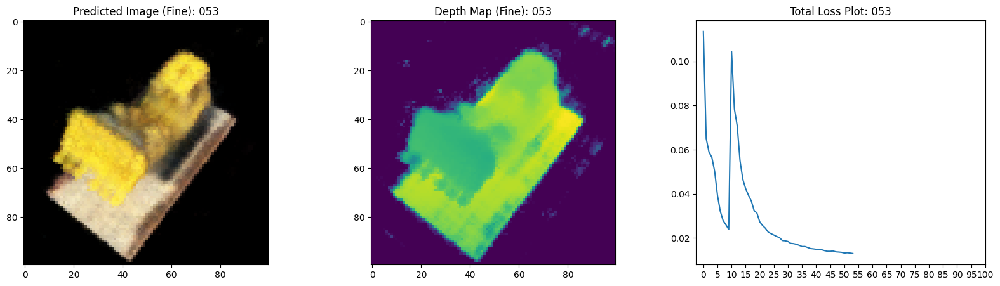

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0130 - coarse_loss: 0.0067 - fine_loss: 0.0063 - coarse_psnr: 21.8424 - fine_psnr: 22.1787 - val_total_loss: 0.0130 - val_coarse_loss: 0.0066 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.9287 - val_fine_psnr: 22.0311
Epoch 55/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0129 - coarse_loss: 0.0067 - fine_loss: 0.0062 - coarse_psnr: 21.8608 - fine_psnr: 22.2133

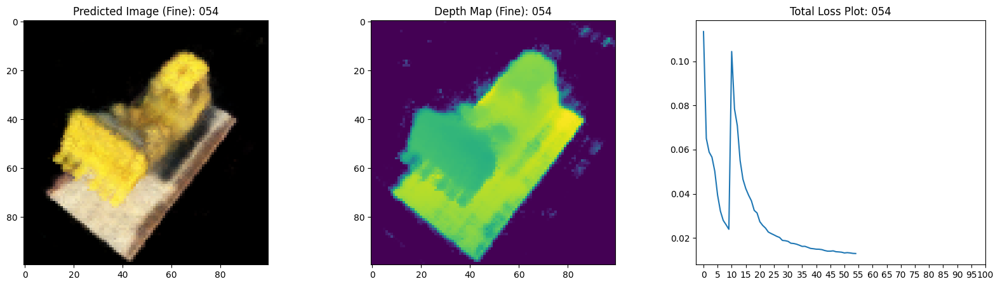

16/16 [==============================] - 11s 723ms/step - total_loss: 0.0129 - coarse_loss: 0.0067 - fine_loss: 0.0062 - coarse_psnr: 21.8608 - fine_psnr: 22.2133 - val_total_loss: 0.0131 - val_coarse_loss: 0.0067 - val_fine_loss: 0.0064 - val_coarse_psnr: 21.8525 - val_fine_psnr: 22.0404
Epoch 56/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0128 - coarse_loss: 0.0067 - fine_loss: 0.0061 - coarse_psnr: 21.9086 - fine_psnr: 22.2685

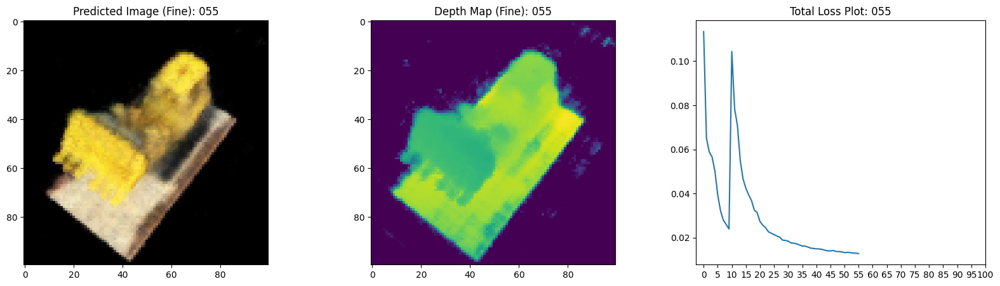

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0128 - coarse_loss: 0.0067 - fine_loss: 0.0061 - coarse_psnr: 21.9086 - fine_psnr: 22.2685 - val_total_loss: 0.0126 - val_coarse_loss: 0.0066 - val_fine_loss: 0.0061 - val_coarse_psnr: 21.9170 - val_fine_psnr: 22.2516
Epoch 57/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0125 - coarse_loss: 0.0065 - fine_loss: 0.0059 - coarse_psnr: 21.9867 - fine_psnr: 22.4105

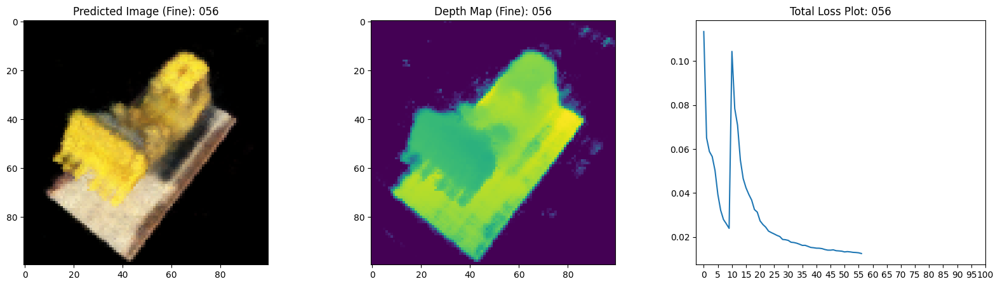

16/16 [==============================] - 12s 753ms/step - total_loss: 0.0125 - coarse_loss: 0.0065 - fine_loss: 0.0059 - coarse_psnr: 21.9867 - fine_psnr: 22.4105 - val_total_loss: 0.0125 - val_coarse_loss: 0.0065 - val_fine_loss: 0.0060 - val_coarse_psnr: 21.9953 - val_fine_psnr: 22.3447
Epoch 58/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0124 - coarse_loss: 0.0065 - fine_loss: 0.0059 - coarse_psnr: 22.0062 - fine_psnr: 22.4408

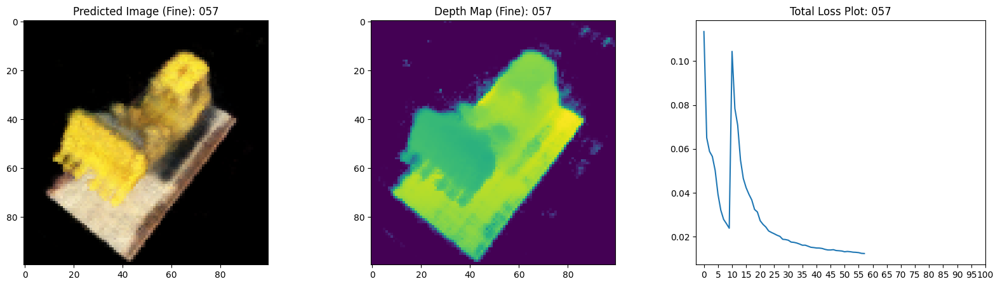

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0124 - coarse_loss: 0.0065 - fine_loss: 0.0059 - coarse_psnr: 22.0062 - fine_psnr: 22.4408 - val_total_loss: 0.0128 - val_coarse_loss: 0.0066 - val_fine_loss: 0.0061 - val_coarse_psnr: 21.8561 - val_fine_psnr: 22.1913
Epoch 59/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0124 - coarse_loss: 0.0065 - fine_loss: 0.0059 - coarse_psnr: 22.0011 - fine_psnr: 22.4303

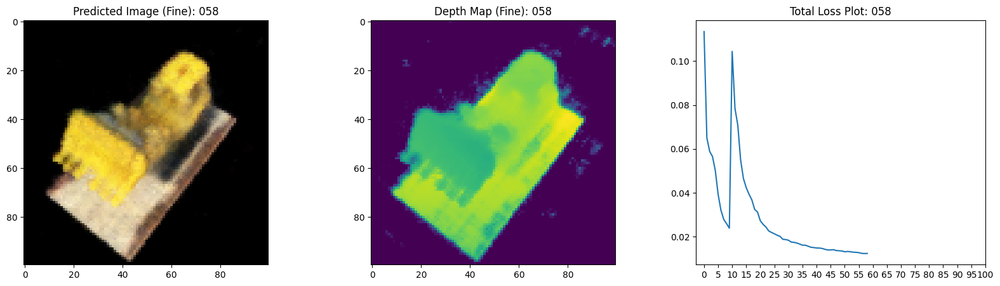

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0124 - coarse_loss: 0.0065 - fine_loss: 0.0059 - coarse_psnr: 22.0011 - fine_psnr: 22.4303 - val_total_loss: 0.0121 - val_coarse_loss: 0.0064 - val_fine_loss: 0.0058 - val_coarse_psnr: 22.0677 - val_fine_psnr: 22.5045
Epoch 60/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0122 - coarse_loss: 0.0064 - fine_loss: 0.0058 - coarse_psnr: 22.0657 - fine_psnr: 22.5172

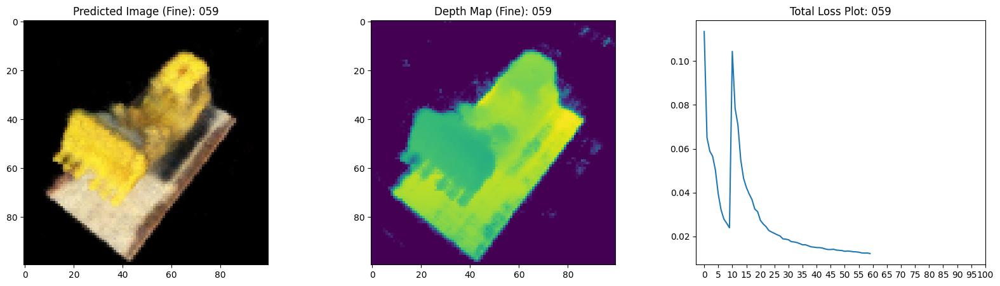

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0122 - coarse_loss: 0.0064 - fine_loss: 0.0058 - coarse_psnr: 22.0657 - fine_psnr: 22.5172 - val_total_loss: 0.0124 - val_coarse_loss: 0.0064 - val_fine_loss: 0.0060 - val_coarse_psnr: 22.0080 - val_fine_psnr: 22.3314
Epoch 61/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0121 - coarse_loss: 0.0063 - fine_loss: 0.0058 - coarse_psnr: 22.1285 - fine_psnr: 22.5087

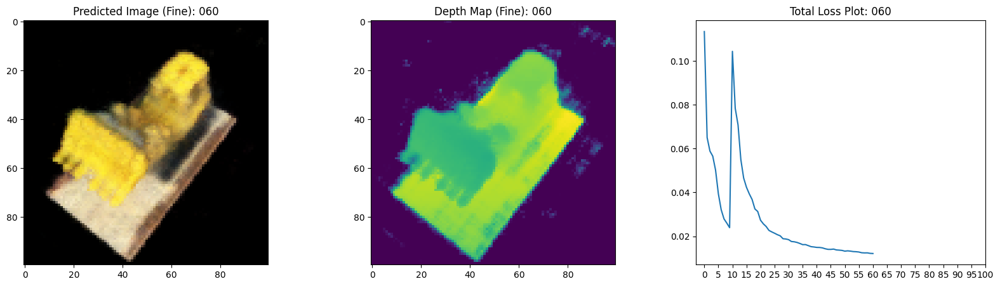

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0121 - coarse_loss: 0.0063 - fine_loss: 0.0058 - coarse_psnr: 22.1285 - fine_psnr: 22.5087 - val_total_loss: 0.0126 - val_coarse_loss: 0.0065 - val_fine_loss: 0.0061 - val_coarse_psnr: 22.0027 - val_fine_psnr: 22.2135
Epoch 62/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0122 - coarse_loss: 0.0063 - fine_loss: 0.0059 - coarse_psnr: 22.1533 - fine_psnr: 22.4600

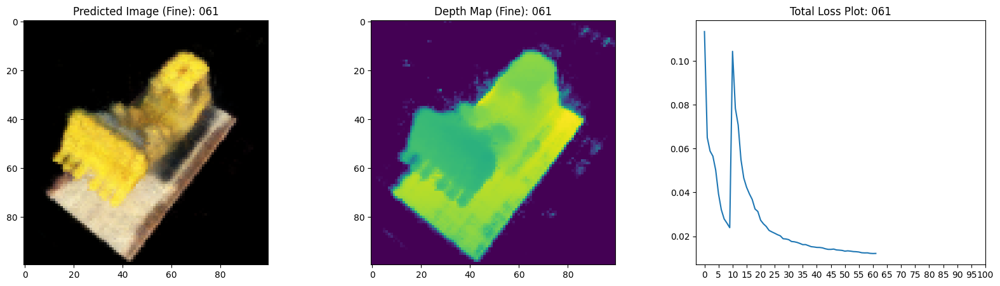

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0122 - coarse_loss: 0.0063 - fine_loss: 0.0059 - coarse_psnr: 22.1533 - fine_psnr: 22.4600 - val_total_loss: 0.0125 - val_coarse_loss: 0.0063 - val_fine_loss: 0.0062 - val_coarse_psnr: 22.1040 - val_fine_psnr: 22.1801
Epoch 63/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0118 - coarse_loss: 0.0061 - fine_loss: 0.0057 - coarse_psnr: 22.2533 - fine_psnr: 22.5892

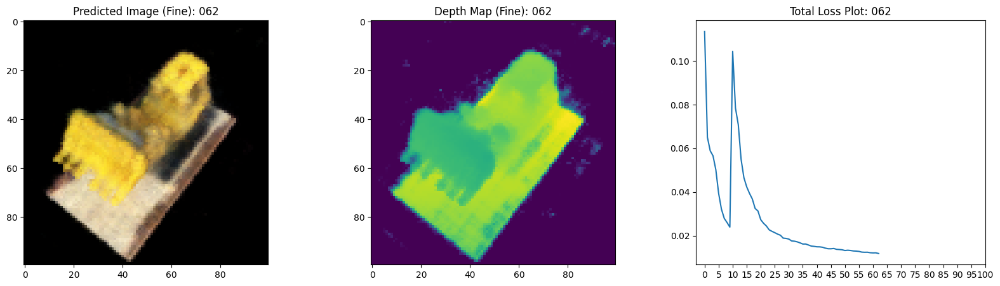

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0118 - coarse_loss: 0.0061 - fine_loss: 0.0057 - coarse_psnr: 22.2533 - fine_psnr: 22.5892 - val_total_loss: 0.0115 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0056 - val_coarse_psnr: 22.3852 - val_fine_psnr: 22.6491
Epoch 64/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0115 - coarse_loss: 0.0060 - fine_loss: 0.0056 - coarse_psnr: 22.3828 - fine_psnr: 22.7145

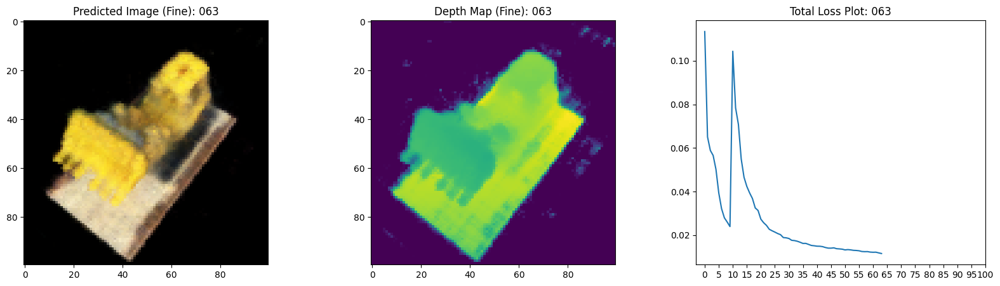

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0115 - coarse_loss: 0.0060 - fine_loss: 0.0056 - coarse_psnr: 22.3828 - fine_psnr: 22.7145 - val_total_loss: 0.0120 - val_coarse_loss: 0.0062 - val_fine_loss: 0.0058 - val_coarse_psnr: 22.1628 - val_fine_psnr: 22.4731
Epoch 65/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0120 - coarse_loss: 0.0063 - fine_loss: 0.0057 - coarse_psnr: 22.1579 - fine_psnr: 22.5626

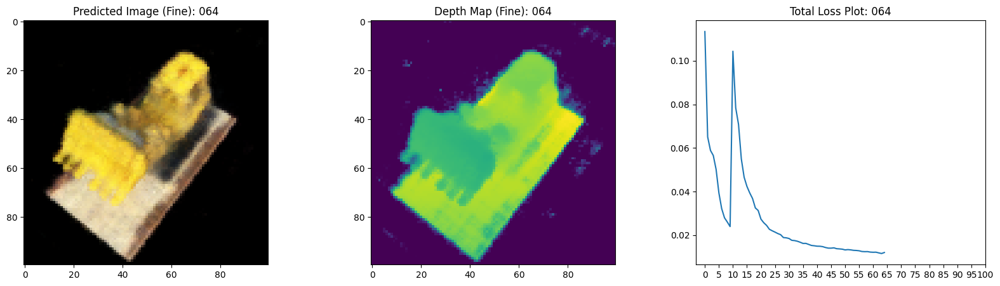

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0120 - coarse_loss: 0.0063 - fine_loss: 0.0057 - coarse_psnr: 22.1579 - fine_psnr: 22.5626 - val_total_loss: 0.0115 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0056 - val_coarse_psnr: 22.3551 - val_fine_psnr: 22.6262
Epoch 66/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0117 - coarse_loss: 0.0061 - fine_loss: 0.0055 - coarse_psnr: 22.2516 - fine_psnr: 22.7145

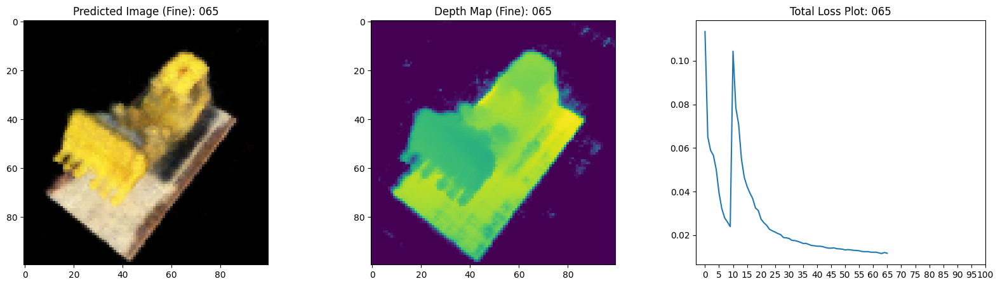

16/16 [==============================] - 12s 727ms/step - total_loss: 0.0117 - coarse_loss: 0.0061 - fine_loss: 0.0055 - coarse_psnr: 22.2516 - fine_psnr: 22.7145 - val_total_loss: 0.0116 - val_coarse_loss: 0.0061 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.2391 - val_fine_psnr: 22.6636
Epoch 67/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0116 - coarse_loss: 0.0061 - fine_loss: 0.0055 - coarse_psnr: 22.2788 - fine_psnr: 22.7690

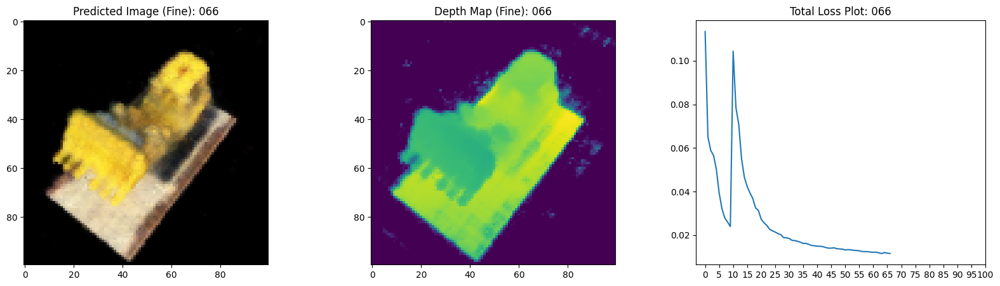

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0116 - coarse_loss: 0.0061 - fine_loss: 0.0055 - coarse_psnr: 22.2788 - fine_psnr: 22.7690 - val_total_loss: 0.0116 - val_coarse_loss: 0.0061 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.2384 - val_fine_psnr: 22.7437
Epoch 68/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0115 - coarse_loss: 0.0061 - fine_loss: 0.0054 - coarse_psnr: 22.2897 - fine_psnr: 22.8039

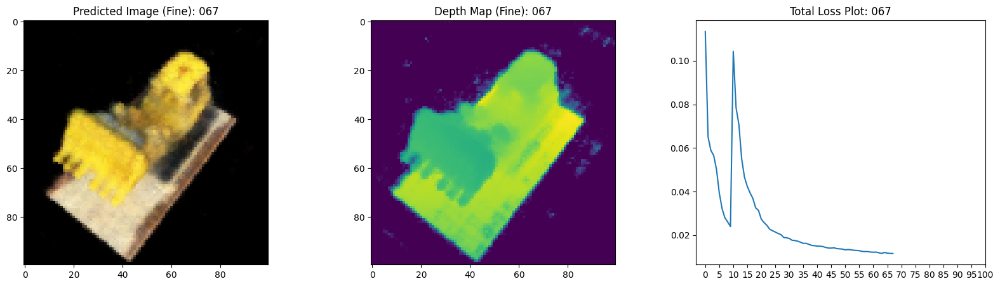

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0115 - coarse_loss: 0.0061 - fine_loss: 0.0054 - coarse_psnr: 22.2897 - fine_psnr: 22.8039 - val_total_loss: 0.0120 - val_coarse_loss: 0.0062 - val_fine_loss: 0.0058 - val_coarse_psnr: 22.1194 - val_fine_psnr: 22.4755
Epoch 69/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0113 - coarse_loss: 0.0059 - fine_loss: 0.0054 - coarse_psnr: 22.4105 - fine_psnr: 22.8572

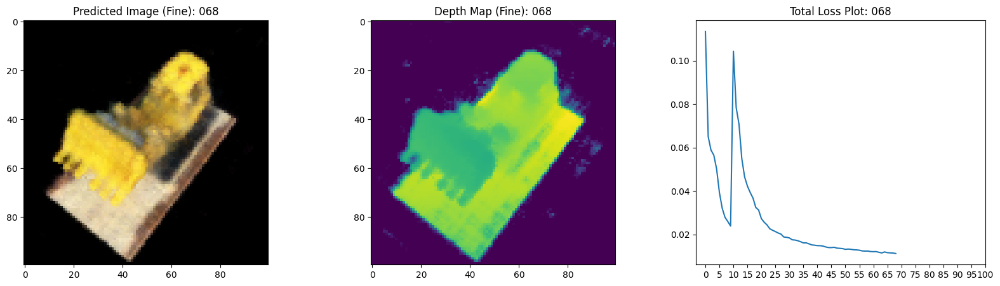

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0113 - coarse_loss: 0.0059 - fine_loss: 0.0054 - coarse_psnr: 22.4105 - fine_psnr: 22.8572 - val_total_loss: 0.0114 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.3545 - val_fine_psnr: 22.7250
Epoch 70/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0112 - coarse_loss: 0.0058 - fine_loss: 0.0053 - coarse_psnr: 22.4900 - fine_psnr: 22.8845

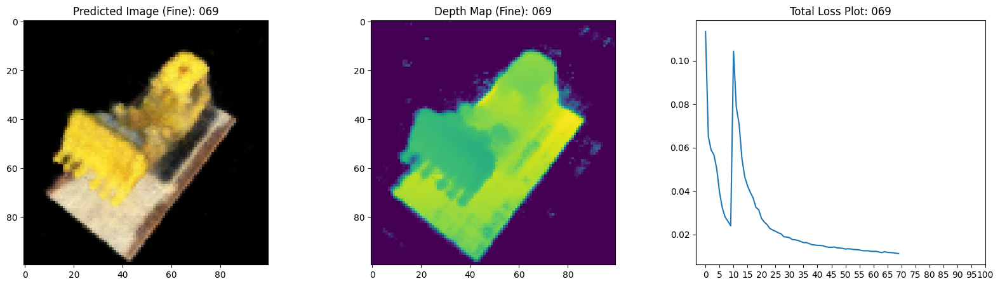

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0112 - coarse_loss: 0.0058 - fine_loss: 0.0053 - coarse_psnr: 22.4900 - fine_psnr: 22.8845 - val_total_loss: 0.0117 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0057 - val_coarse_psnr: 22.2882 - val_fine_psnr: 22.5000
Epoch 71/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0112 - coarse_loss: 0.0058 - fine_loss: 0.0054 - coarse_psnr: 22.5006 - fine_psnr: 22.8623

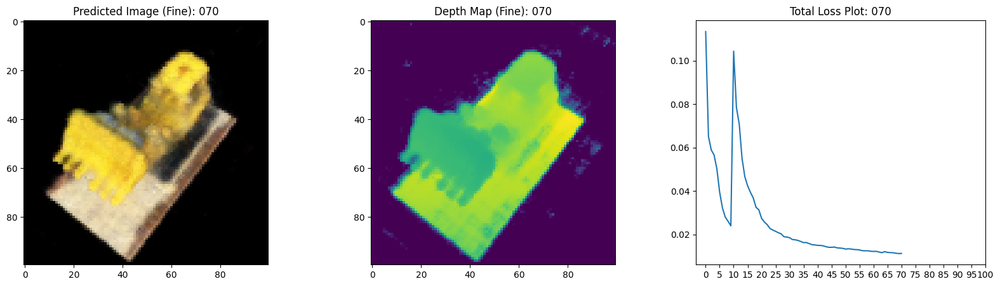

16/16 [==============================] - 12s 748ms/step - total_loss: 0.0112 - coarse_loss: 0.0058 - fine_loss: 0.0054 - coarse_psnr: 22.5006 - fine_psnr: 22.8623 - val_total_loss: 0.0112 - val_coarse_loss: 0.0057 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.5657 - val_fine_psnr: 22.7003
Epoch 72/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0113 - coarse_loss: 0.0059 - fine_loss: 0.0054 - coarse_psnr: 22.4272 - fine_psnr: 22.8483

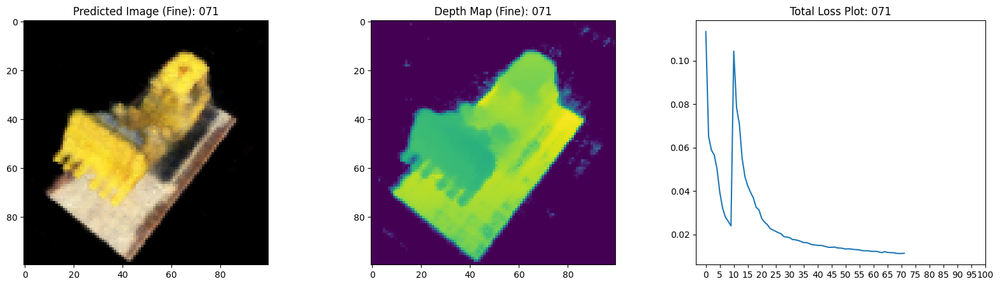

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0113 - coarse_loss: 0.0059 - fine_loss: 0.0054 - coarse_psnr: 22.4272 - fine_psnr: 22.8483 - val_total_loss: 0.0114 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.3787 - val_fine_psnr: 22.7352
Epoch 73/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0112 - coarse_loss: 0.0059 - fine_loss: 0.0053 - coarse_psnr: 22.4583 - fine_psnr: 22.8931

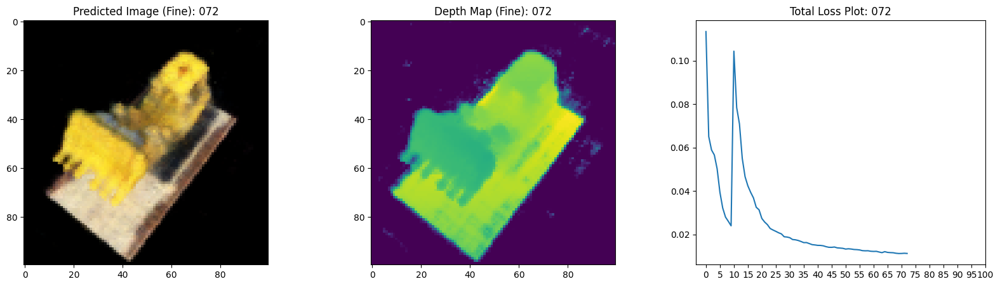

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0112 - coarse_loss: 0.0059 - fine_loss: 0.0053 - coarse_psnr: 22.4583 - fine_psnr: 22.8931 - val_total_loss: 0.0104 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0050 - val_coarse_psnr: 22.7430 - val_fine_psnr: 23.1524
Epoch 74/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0107 - coarse_loss: 0.0057 - fine_loss: 0.0051 - coarse_psnr: 22.6125 - fine_psnr: 23.0746

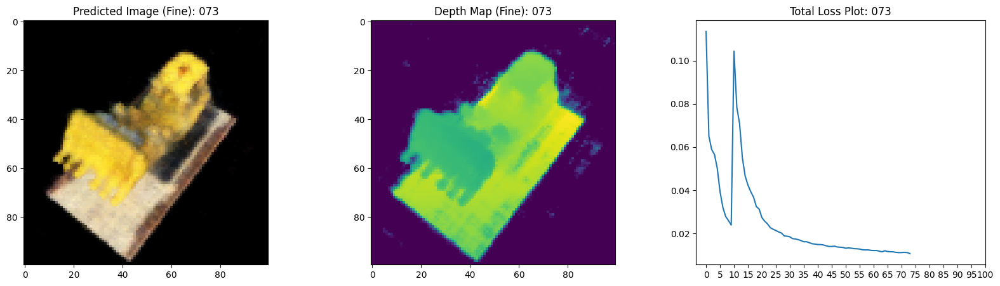

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0107 - coarse_loss: 0.0057 - fine_loss: 0.0051 - coarse_psnr: 22.6125 - fine_psnr: 23.0746 - val_total_loss: 0.0108 - val_coarse_loss: 0.0056 - val_fine_loss: 0.0051 - val_coarse_psnr: 22.6042 - val_fine_psnr: 22.9805
Epoch 75/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0107 - coarse_loss: 0.0056 - fine_loss: 0.0050 - coarse_psnr: 22.6465 - fine_psnr: 23.1073

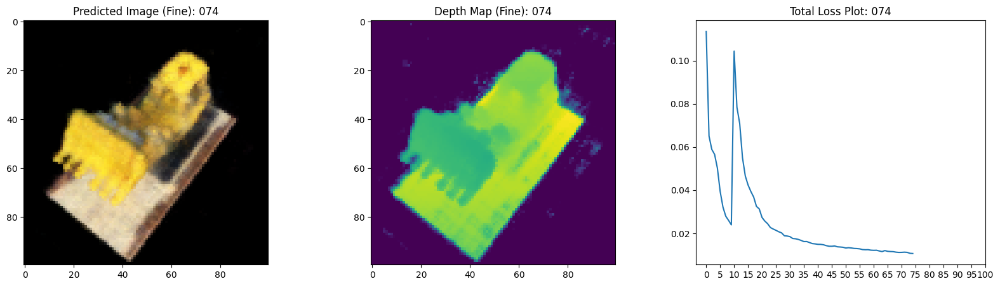

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0107 - coarse_loss: 0.0056 - fine_loss: 0.0050 - coarse_psnr: 22.6465 - fine_psnr: 23.1073 - val_total_loss: 0.0106 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0051 - val_coarse_psnr: 22.7452 - val_fine_psnr: 23.0575
Epoch 76/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0105 - coarse_loss: 0.0055 - fine_loss: 0.0050 - coarse_psnr: 22.7451 - fine_psnr: 23.1713

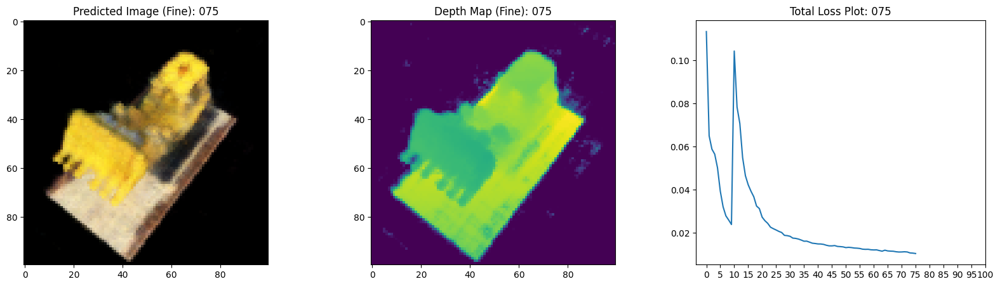

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0105 - coarse_loss: 0.0055 - fine_loss: 0.0050 - coarse_psnr: 22.7451 - fine_psnr: 23.1713 - val_total_loss: 0.0106 - val_coarse_loss: 0.0055 - val_fine_loss: 0.0051 - val_coarse_psnr: 22.6912 - val_fine_psnr: 23.0650
Epoch 77/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0106 - coarse_loss: 0.0056 - fine_loss: 0.0050 - coarse_psnr: 22.6820 - fine_psnr: 23.1293

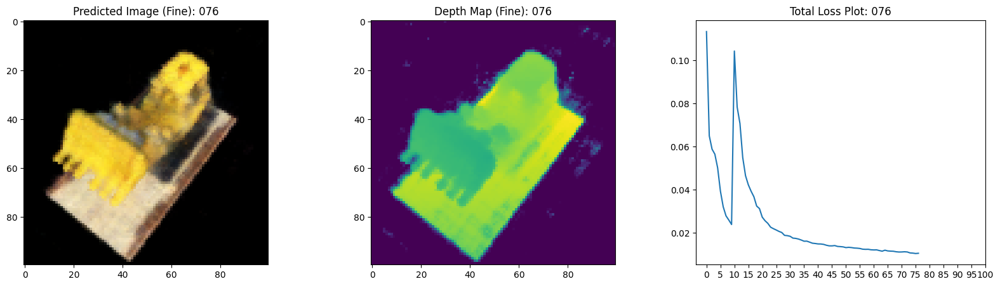

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0106 - coarse_loss: 0.0056 - fine_loss: 0.0050 - coarse_psnr: 22.6820 - fine_psnr: 23.1293 - val_total_loss: 0.0110 - val_coarse_loss: 0.0058 - val_fine_loss: 0.0052 - val_coarse_psnr: 22.4713 - val_fine_psnr: 22.8955
Epoch 78/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0107 - coarse_loss: 0.0057 - fine_loss: 0.0050 - coarse_psnr: 22.5857 - fine_psnr: 23.1032

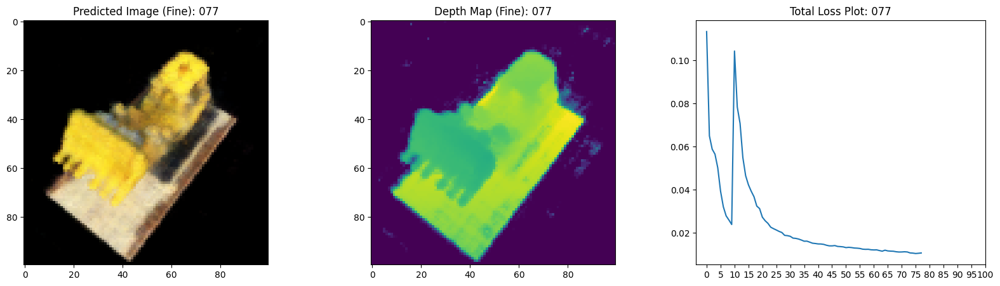

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0107 - coarse_loss: 0.0057 - fine_loss: 0.0050 - coarse_psnr: 22.5857 - fine_psnr: 23.1032 - val_total_loss: 0.0115 - val_coarse_loss: 0.0060 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.2797 - val_fine_psnr: 22.6488
Epoch 79/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0109 - coarse_loss: 0.0058 - fine_loss: 0.0052 - coarse_psnr: 22.4945 - fine_psnr: 23.0018

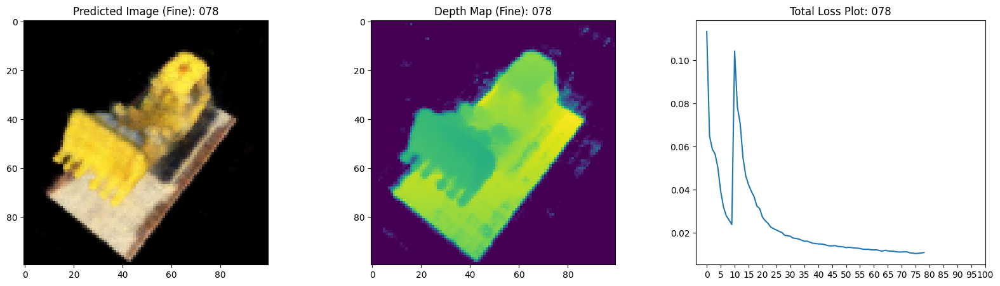

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0109 - coarse_loss: 0.0058 - fine_loss: 0.0052 - coarse_psnr: 22.4945 - fine_psnr: 23.0018 - val_total_loss: 0.0112 - val_coarse_loss: 0.0059 - val_fine_loss: 0.0054 - val_coarse_psnr: 22.4093 - val_fine_psnr: 22.7742
Epoch 80/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0106 - coarse_loss: 0.0056 - fine_loss: 0.0050 - coarse_psnr: 22.6811 - fine_psnr: 23.1641

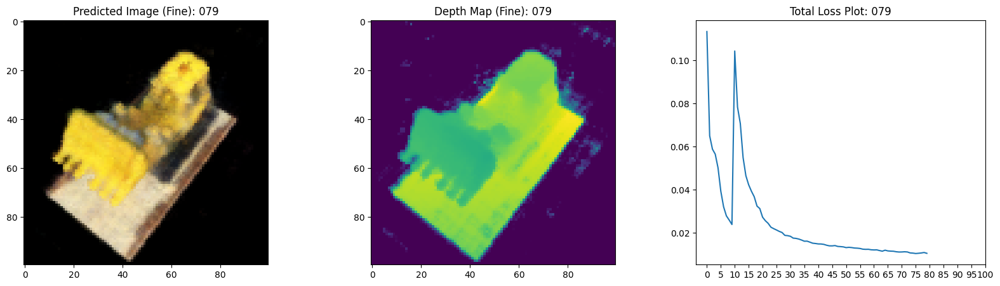

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0106 - coarse_loss: 0.0056 - fine_loss: 0.0050 - coarse_psnr: 22.6811 - fine_psnr: 23.1641 - val_total_loss: 0.0112 - val_coarse_loss: 0.0057 - val_fine_loss: 0.0055 - val_coarse_psnr: 22.5357 - val_fine_psnr: 22.6380
Epoch 81/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0106 - coarse_loss: 0.0055 - fine_loss: 0.0051 - coarse_psnr: 22.7009 - fine_psnr: 23.0891

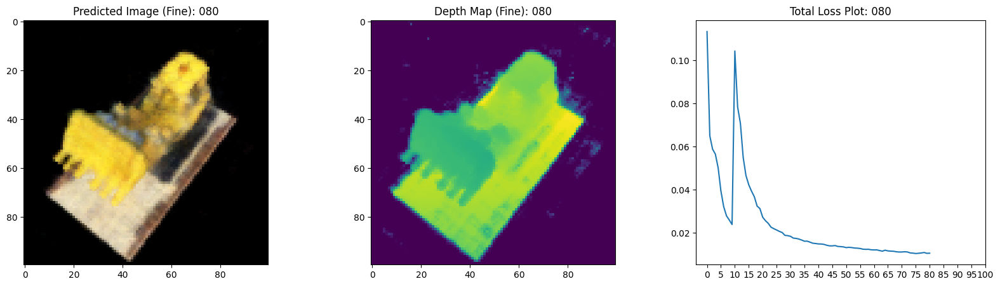

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0106 - coarse_loss: 0.0055 - fine_loss: 0.0051 - coarse_psnr: 22.7009 - fine_psnr: 23.0891 - val_total_loss: 0.0103 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0050 - val_coarse_psnr: 22.8540 - val_fine_psnr: 23.1439
Epoch 82/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0103 - coarse_loss: 0.0054 - fine_loss: 0.0049 - coarse_psnr: 22.7809 - fine_psnr: 23.2317

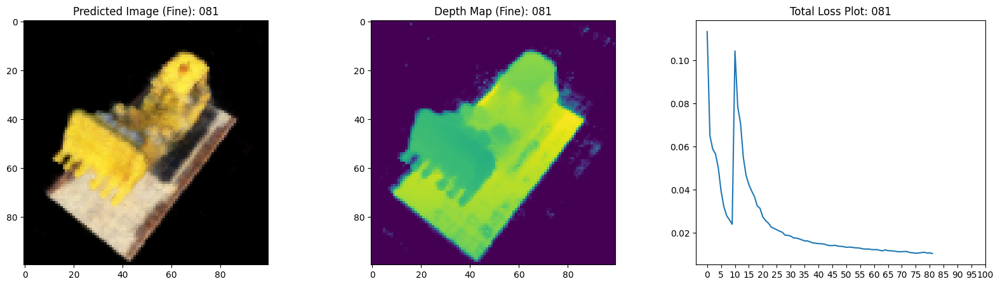

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0103 - coarse_loss: 0.0054 - fine_loss: 0.0049 - coarse_psnr: 22.7809 - fine_psnr: 23.2317 - val_total_loss: 0.0101 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0049 - val_coarse_psnr: 22.9358 - val_fine_psnr: 23.2239
Epoch 83/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0101 - coarse_loss: 0.0053 - fine_loss: 0.0048 - coarse_psnr: 22.8732 - fine_psnr: 23.3358

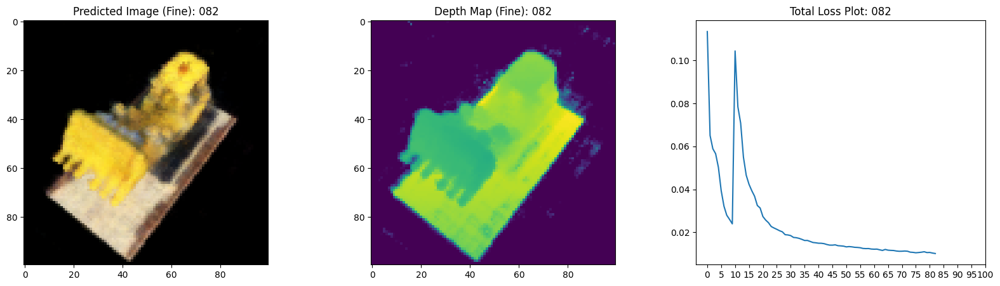

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0101 - coarse_loss: 0.0053 - fine_loss: 0.0048 - coarse_psnr: 22.8732 - fine_psnr: 23.3358 - val_total_loss: 0.0097 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0047 - val_coarse_psnr: 23.1174 - val_fine_psnr: 23.4007
Epoch 84/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0099 - coarse_loss: 0.0052 - fine_loss: 0.0047 - coarse_psnr: 22.9747 - fine_psnr: 23.4287

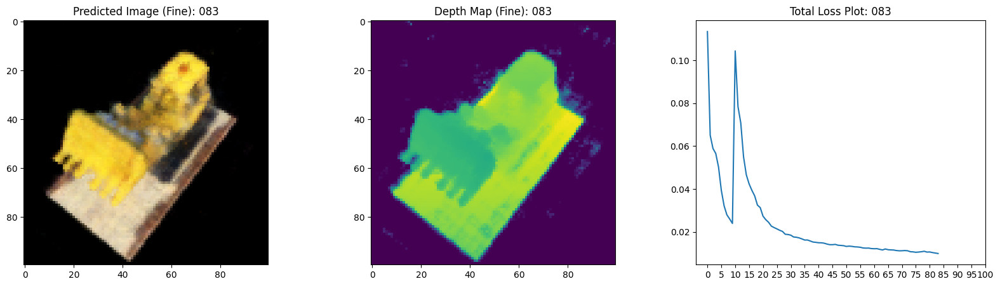

16/16 [==============================] - 12s 747ms/step - total_loss: 0.0099 - coarse_loss: 0.0052 - fine_loss: 0.0047 - coarse_psnr: 22.9747 - fine_psnr: 23.4287 - val_total_loss: 0.0096 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0046 - val_coarse_psnr: 23.1824 - val_fine_psnr: 23.4769
Epoch 85/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0099 - coarse_loss: 0.0052 - fine_loss: 0.0047 - coarse_psnr: 22.9681 - fine_psnr: 23.4350

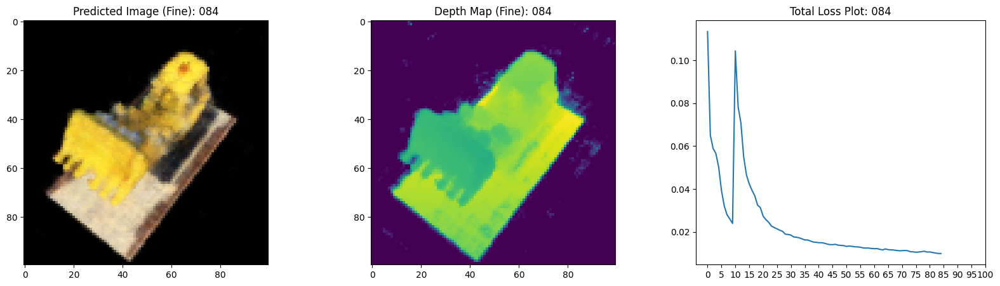

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0099 - coarse_loss: 0.0052 - fine_loss: 0.0047 - coarse_psnr: 22.9681 - fine_psnr: 23.4350 - val_total_loss: 0.0099 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0048 - val_coarse_psnr: 23.0610 - val_fine_psnr: 23.3274
Epoch 86/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0099 - coarse_loss: 0.0052 - fine_loss: 0.0047 - coarse_psnr: 22.9653 - fine_psnr: 23.3740

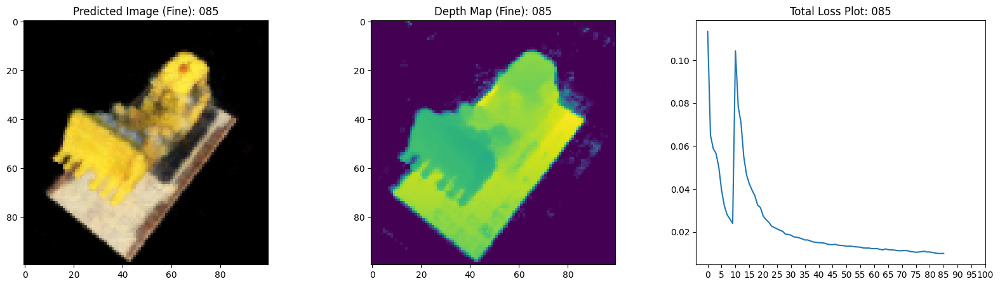

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0099 - coarse_loss: 0.0052 - fine_loss: 0.0047 - coarse_psnr: 22.9653 - fine_psnr: 23.3740 - val_total_loss: 0.0102 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0050 - val_coarse_psnr: 22.9393 - val_fine_psnr: 23.1393
Epoch 87/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0100 - coarse_loss: 0.0052 - fine_loss: 0.0048 - coarse_psnr: 22.9447 - fine_psnr: 23.3632

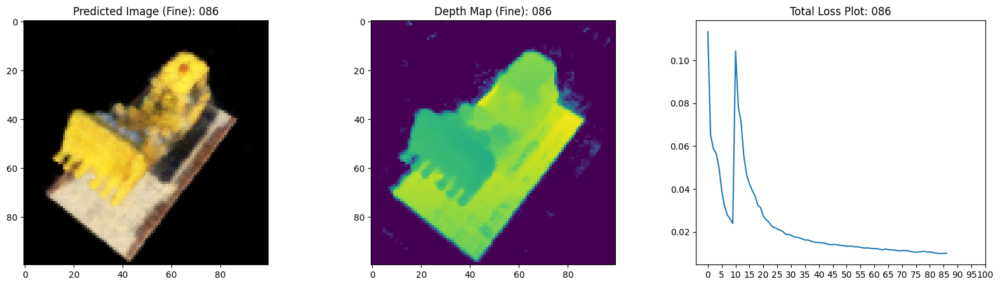

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0100 - coarse_loss: 0.0052 - fine_loss: 0.0048 - coarse_psnr: 22.9447 - fine_psnr: 23.3632 - val_total_loss: 0.0099 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0048 - val_coarse_psnr: 23.0510 - val_fine_psnr: 23.2852
Epoch 88/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0098 - coarse_loss: 0.0051 - fine_loss: 0.0046 - coarse_psnr: 23.0365 - fine_psnr: 23.4807

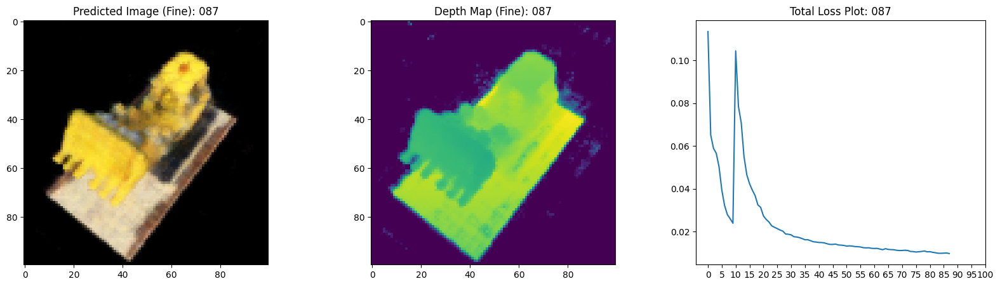

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0098 - coarse_loss: 0.0051 - fine_loss: 0.0046 - coarse_psnr: 23.0365 - fine_psnr: 23.4807 - val_total_loss: 0.0102 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0049 - val_coarse_psnr: 22.8717 - val_fine_psnr: 23.2065
Epoch 89/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0097 - coarse_loss: 0.0051 - fine_loss: 0.0046 - coarse_psnr: 23.0255 - fine_psnr: 23.5046

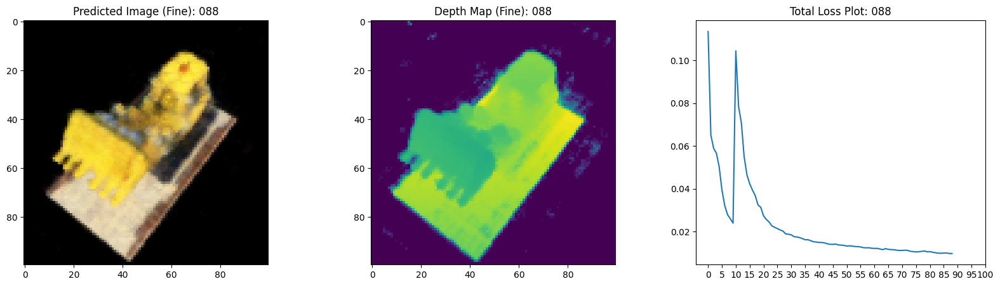

16/16 [==============================] - 12s 726ms/step - total_loss: 0.0097 - coarse_loss: 0.0051 - fine_loss: 0.0046 - coarse_psnr: 23.0255 - fine_psnr: 23.5046 - val_total_loss: 0.0102 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0049 - val_coarse_psnr: 22.9176 - val_fine_psnr: 23.1987
Epoch 90/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0098 - coarse_loss: 0.0051 - fine_loss: 0.0046 - coarse_psnr: 23.0291 - fine_psnr: 23.4904

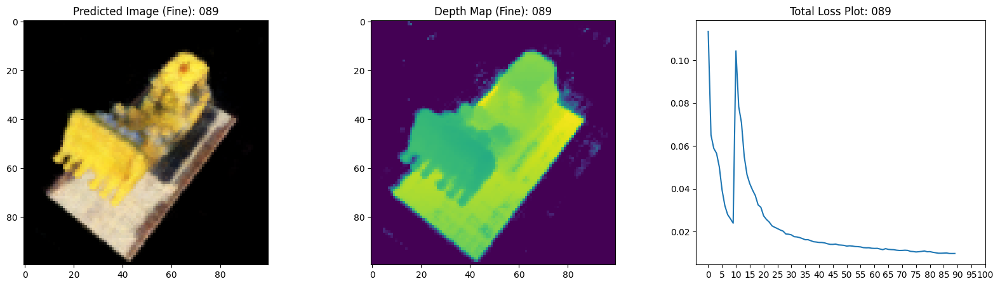

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0098 - coarse_loss: 0.0051 - fine_loss: 0.0046 - coarse_psnr: 23.0291 - fine_psnr: 23.4904 - val_total_loss: 0.0099 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0048 - val_coarse_psnr: 22.9881 - val_fine_psnr: 23.3061
Epoch 91/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0098 - coarse_loss: 0.0052 - fine_loss: 0.0046 - coarse_psnr: 22.9234 - fine_psnr: 23.4859

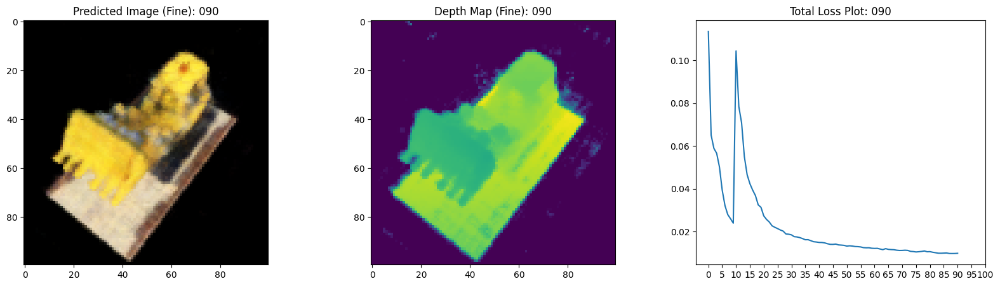

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0098 - coarse_loss: 0.0052 - fine_loss: 0.0046 - coarse_psnr: 22.9234 - fine_psnr: 23.4859 - val_total_loss: 0.0099 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0047 - val_coarse_psnr: 22.9094 - val_fine_psnr: 23.3871
Epoch 92/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0096 - coarse_loss: 0.0051 - fine_loss: 0.0045 - coarse_psnr: 23.0227 - fine_psnr: 23.6378

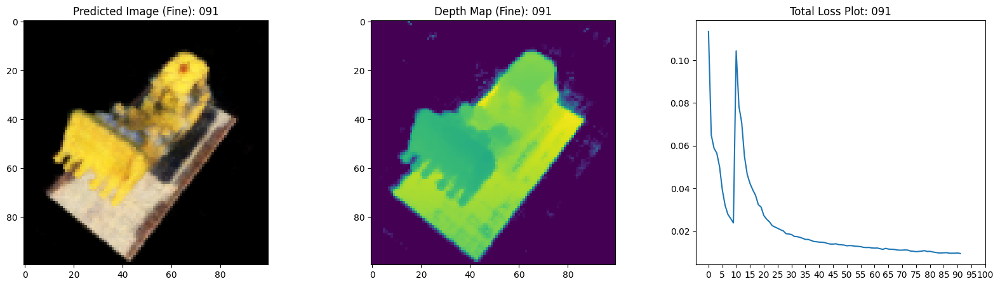

16/16 [==============================] - 11s 723ms/step - total_loss: 0.0096 - coarse_loss: 0.0051 - fine_loss: 0.0045 - coarse_psnr: 23.0227 - fine_psnr: 23.6378 - val_total_loss: 0.0097 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0046 - val_coarse_psnr: 23.0005 - val_fine_psnr: 23.4740
Epoch 93/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0095 - coarse_loss: 0.0050 - fine_loss: 0.0044 - coarse_psnr: 23.0997 - fine_psnr: 23.6746

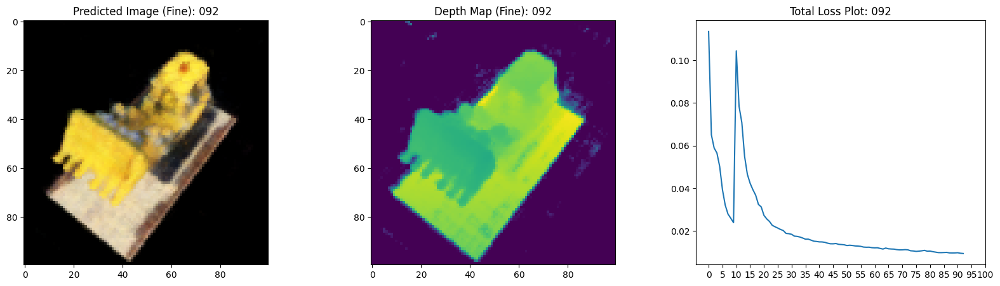

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0095 - coarse_loss: 0.0050 - fine_loss: 0.0044 - coarse_psnr: 23.0997 - fine_psnr: 23.6746 - val_total_loss: 0.0097 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0046 - val_coarse_psnr: 23.0660 - val_fine_psnr: 23.4878
Epoch 94/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0096 - coarse_loss: 0.0051 - fine_loss: 0.0045 - coarse_psnr: 23.0734 - fine_psnr: 23.5830

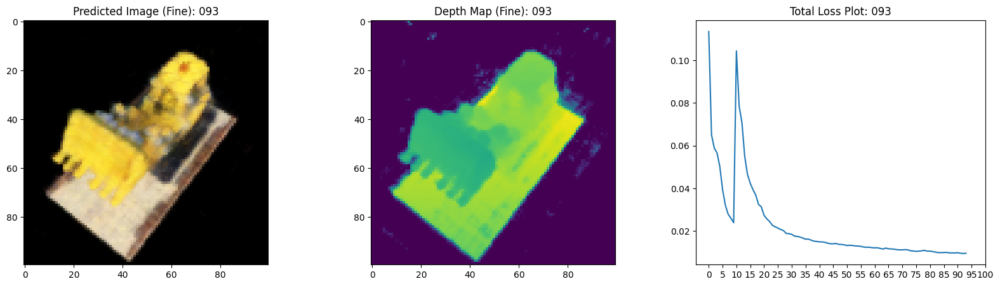

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0096 - coarse_loss: 0.0051 - fine_loss: 0.0045 - coarse_psnr: 23.0734 - fine_psnr: 23.5830 - val_total_loss: 0.0103 - val_coarse_loss: 0.0053 - val_fine_loss: 0.0050 - val_coarse_psnr: 22.8147 - val_fine_psnr: 23.1218
Epoch 95/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0096 - coarse_loss: 0.0051 - fine_loss: 0.0045 - coarse_psnr: 23.0570 - fine_psnr: 23.5940

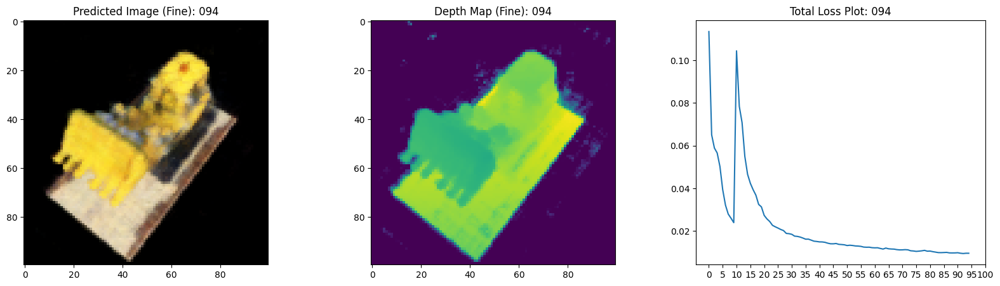

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0096 - coarse_loss: 0.0051 - fine_loss: 0.0045 - coarse_psnr: 23.0570 - fine_psnr: 23.5940 - val_total_loss: 0.0099 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0047 - val_coarse_psnr: 23.0037 - val_fine_psnr: 23.3483
Epoch 96/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0095 - coarse_loss: 0.0051 - fine_loss: 0.0045 - coarse_psnr: 23.0386 - fine_psnr: 23.6205

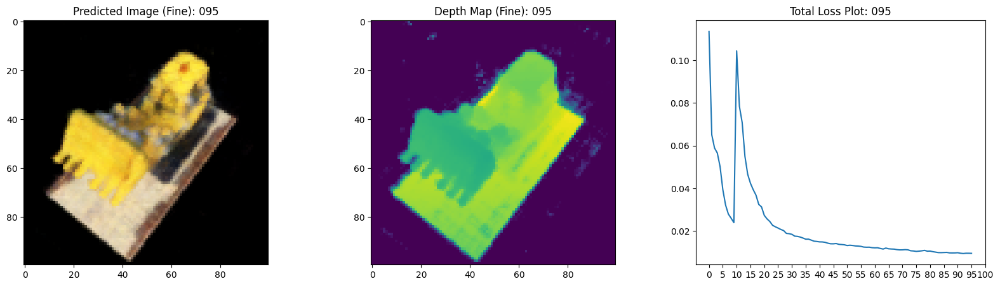

16/16 [==============================] - 11s 725ms/step - total_loss: 0.0095 - coarse_loss: 0.0051 - fine_loss: 0.0045 - coarse_psnr: 23.0386 - fine_psnr: 23.6205 - val_total_loss: 0.0094 - val_coarse_loss: 0.0049 - val_fine_loss: 0.0045 - val_coarse_psnr: 23.2102 - val_fine_psnr: 23.5470
Epoch 97/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0094 - coarse_loss: 0.0050 - fine_loss: 0.0044 - coarse_psnr: 23.1574 - fine_psnr: 23.7011

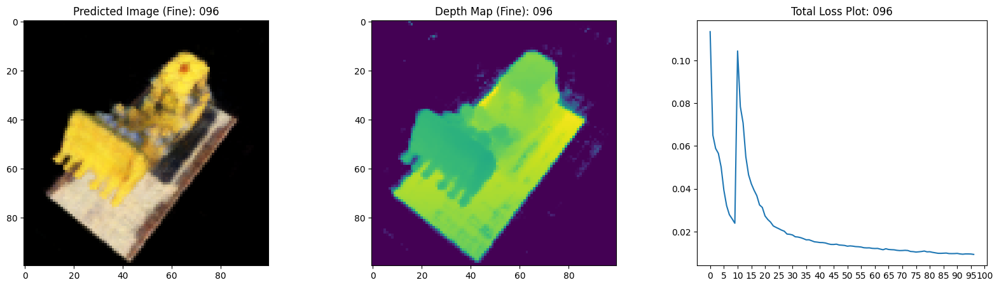

16/16 [==============================] - 11s 724ms/step - total_loss: 0.0094 - coarse_loss: 0.0050 - fine_loss: 0.0044 - coarse_psnr: 23.1574 - fine_psnr: 23.7011 - val_total_loss: 0.0090 - val_coarse_loss: 0.0047 - val_fine_loss: 0.0043 - val_coarse_psnr: 23.3670 - val_fine_psnr: 23.8129
Epoch 98/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0092 - coarse_loss: 0.0049 - fine_loss: 0.0043 - coarse_psnr: 23.2318 - fine_psnr: 23.7794

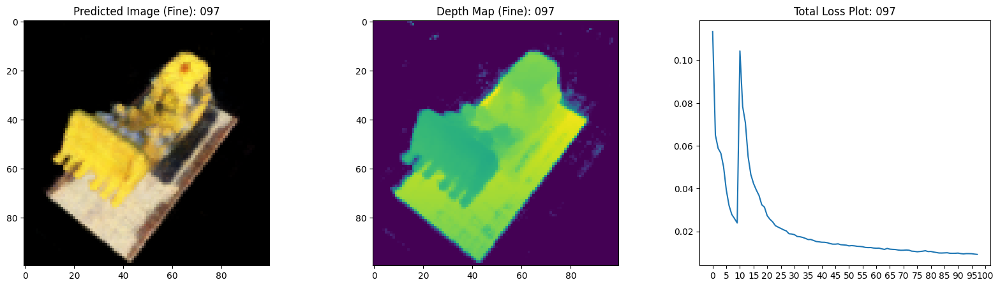

16/16 [==============================] - 12s 748ms/step - total_loss: 0.0092 - coarse_loss: 0.0049 - fine_loss: 0.0043 - coarse_psnr: 23.2318 - fine_psnr: 23.7794 - val_total_loss: 0.0100 - val_coarse_loss: 0.0052 - val_fine_loss: 0.0048 - val_coarse_psnr: 22.9325 - val_fine_psnr: 23.3144
Epoch 99/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0094 - coarse_loss: 0.0050 - fine_loss: 0.0043 - coarse_psnr: 23.1064 - fine_psnr: 23.7482

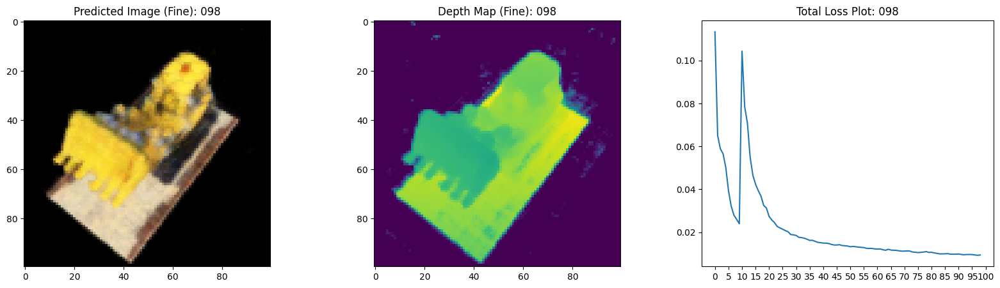

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0094 - coarse_loss: 0.0050 - fine_loss: 0.0043 - coarse_psnr: 23.1064 - fine_psnr: 23.7482 - val_total_loss: 0.0096 - val_coarse_loss: 0.0051 - val_fine_loss: 0.0045 - val_coarse_psnr: 23.0309 - val_fine_psnr: 23.5371
Epoch 100/100
16/16 [==============================] - ETA: 0s - total_loss: 0.0092 - coarse_loss: 0.0049 - fine_loss: 0.0043 - coarse_psnr: 23.1919 - fine_psnr: 23.8031

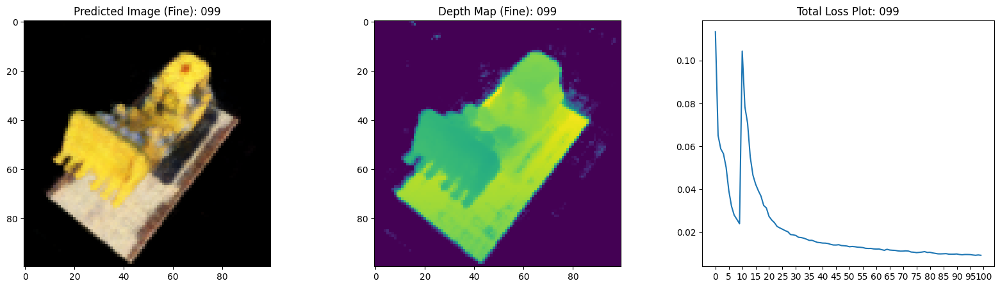

16/16 [==============================] - 12s 725ms/step - total_loss: 0.0092 - coarse_loss: 0.0049 - fine_loss: 0.0043 - coarse_psnr: 23.1919 - fine_psnr: 23.8031 - val_total_loss: 0.0094 - val_coarse_loss: 0.0050 - val_fine_loss: 0.0045 - val_coarse_psnr: 23.1065 - val_fine_psnr: 23.5850


100%|██████████| 100/100 [00:01<00:00, 78.90it/s]


In [9]:
class EpochUpdaterCallback(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        self.model.current_epoch.assign(epoch)
        
class NeRF(keras.Model):
    def __init__(self, nerf_model_coarse, nerf_model_fine, warmup_epochs=0):
        super().__init__()
        self.nerf_model_coarse = nerf_model_coarse
        self.nerf_model_fine = nerf_model_fine
        self.warmup_epochs = warmup_epochs
        self.current_epoch = tf.Variable(0, trainable=False, dtype=tf.int64)

    def compile(self, optimizer_coarse, optimizer_fine, loss_fn):
        super().compile()
        self.optimizer_coarse = optimizer_coarse
        self.optimizer_fine = optimizer_fine
        self.loss_fn = loss_fn

        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.coarse_loss_tracker = keras.metrics.Mean(name="coarse_loss")
        self.fine_loss_tracker = keras.metrics.Mean(name="fine_loss")
        self.coarse_psnr_metric = keras.metrics.Mean(name="coarse_psnr")
        self.fine_psnr_metric = keras.metrics.Mean(name="fine_psnr")

    def train_step(self, inputs):
        images, (ray_origins, ray_directions) = inputs

        with tf.GradientTape(persistent=True) as tape:
            # --- Coarse 패스 (항상) ---
            rgb_fine, _, extras = render_rays_hierarchical(
                model_coarse = self.nerf_model_coarse,
                model_fine   = self.nerf_model_fine,
                ray_origins  = ray_origins,
                ray_directions = ray_directions,
                near=2.0, far=6.0,
                perturb_coarse=True,
                train=True
            )
            rgb_coarse = extras["rgb_coarse"]

            loss_coarse = self.loss_fn(images, rgb_coarse)

            # --- Warmup 마스크를 Tensor 연산으로 생성 ---
            # current_epoch < warmup_epochs 이면 1.0, 아니면 0.0
            warmup_mask = tf.cast(
                tf.less(self.current_epoch, self.warmup_epochs),
                tf.float32
            )
            # loss_fine 은 warmup 기간엔 0, 이후엔 실제 fine loss
            loss_fine = self.loss_fn(images, rgb_fine) * (1.0 - warmup_mask)

            total_loss = loss_coarse + loss_fine

        # Coarse 모델 업데이트
        grads_coarse = tape.gradient(total_loss, self.nerf_model_coarse.trainable_variables)
        self.optimizer_coarse.apply_gradients(zip(grads_coarse, self.nerf_model_coarse.trainable_variables))

        # Fine 모델 업데이트 (warmup 기간엔 loss_fine==0 이므로 gradient도 0)
        grads_fine = tape.gradient(total_loss, self.nerf_model_fine.trainable_variables)
        self.optimizer_fine.apply_gradients(zip(grads_fine, self.nerf_model_fine.trainable_variables))

        del tape

        # PSNR 계산
        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val   = tf.image.psnr(images, rgb_fine,   max_val=1.0)

        # Metric 업데이트
        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        # warmup_mask이 1일 때는 loss_fine*0 → metric에 0 저장
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, inputs):
        (images, rays_od) = inputs
        ray_origins, ray_directions = rays_od

        rgb_fine, _, extras = render_rays_hierarchical(
            model_coarse=self.nerf_model_coarse,
            model_fine=self.nerf_model_fine,
            ray_origins=ray_origins,
            ray_directions=ray_directions,
            near=2.0,
            far=6.0,
            perturb_coarse=False,
            train=False
        )
        rgb_coarse = extras["rgb_coarse"]

        loss_coarse = self.loss_fn(images, rgb_coarse)
        loss_fine = self.loss_fn(images, rgb_fine)
        total_loss = loss_coarse + loss_fine

        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val = tf.image.psnr(images, rgb_fine, max_val=1.0)

        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)

        return {m.name: m.result() for m in self.metrics}

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.coarse_loss_tracker,
            self.fine_loss_tracker,
            self.coarse_psnr_metric,
            self.fine_psnr_metric
        ]
monitor_data_iter = iter(val_ds) # 검증 데이터셋 사용 권장, 없으면 train_ds
monitor_images_batch, (monitor_ray_origins_batch, monitor_ray_directions_batch) = next(monitor_data_iter)
del monitor_data_iter

loss_list = [] # TrainMonitor에서 사용

class TrainMonitor(keras.callbacks.Callback):
    def __init__(self, images_batch, ray_origins_batch, ray_directions_batch, near=2.0, far=6.0):
        super().__init__()
        self.images_batch = images_batch
        self.ray_origins_batch = ray_origins_batch
        self.ray_directions_batch = ray_directions_batch
        self.near = near
        self.far = far


    def on_epoch_end(self, epoch, logs=None):
        # logs에는 total_loss, coarse_loss, fine_loss, coarse_psnr, fine_psnr 등이 포함됨
        # current_loss = logs.get("loss", None) # NeRF 모델의 'loss' metric (total_loss)
        current_loss = logs.get("total_loss", None)
        if current_loss is not None:
            loss_list.append(current_loss)
        
        # 저장된 배치 데이터를 사용하여 이미지 생성
        recons_images_fine, depth_maps_fine, extras = render_rays_hierarchical(
            model_coarse=self.model.nerf_model_coarse, # 콜백 내에서는 self.model로 접근
            model_fine=self.model.nerf_model_fine,
            ray_origins=self.ray_origins_batch,
            ray_directions=self.ray_directions_batch,
            near=self.near, 
            far=self.far,
            perturb_coarse=False, # 시각화 시에는 deterministic
            train=False, # predict 모드
        )
        
        # Plot the rgb (fine), depth (fine) and the loss plot.
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
        ax[0].imshow(tf.keras.utils.array_to_img(recons_images_fine[0])) # 배치의 첫 번째 이미지
        ax[0].set_title(f"Predicted Image (Fine): {epoch:03d}")

        ax[1].imshow(tf.keras.utils.array_to_img(depth_maps_fine[0, ..., None]))
        ax[1].set_title(f"Depth Map (Fine): {epoch:03d}")

        if loss_list: # loss_list가 비어있지 않을 때만 plot
            ax[2].plot(loss_list)
            ax[2].set_xticks(np.arange(0, EPOCHS + 1, 5.0 if EPOCHS >=5 else 1.0))
            ax[2].set_title(f"Total Loss Plot: {epoch:03d}")

        fig.savefig(f"images/{epoch:03d}.png")
        plt.show() # 노트북에서 너무 많은 창이 뜨는 것을 방지하려면 주석 처리 권장
        plt.close(fig)


# 모델 생성
# SINGLE_COORD_ENCODED_DIMS는 이전 셀에서 정의된 전역 변수
nerf_model_coarse = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS)
nerf_model_fine = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS) # 동일 구조 사용

# model = NeRF(nerf_model_coarse, nerf_model_fine)
model = NeRF(nerf_model_coarse, nerf_model_fine, warmup_epochs=WARMUP_EPOCHS)


# 옵티마이저 생성 (Coarse와 Fine에 대해 별도 또는 공유 가능)
# 여기서는 학습률이 동일한 별도의 옵티마이저 사용
optimizer_coarse = tf.keras.optimizers.Adam() # 원본 NeRF 학습률 참고
optimizer_fine = tf.keras.optimizers.Adam()

model.compile(
    optimizer_coarse=optimizer_coarse,
    optimizer_fine=optimizer_fine,
    loss_fn=keras.losses.MeanSquaredError()
)

# 이미지 저장 디렉토리 생성
if not os.path.exists("images"):
    os.makedirs("images")

# TrainMonitor 인스턴스 생성 시 준비된 데이터 전달
train_monitor_callback = TrainMonitor(
    images_batch=monitor_images_batch,
    ray_origins_batch=monitor_ray_origins_batch,
    ray_directions_batch=monitor_ray_directions_batch
)

# 모델 학습
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[
        train_monitor_callback, # 기존 콜백 유지
        EpochUpdaterCallback()  # 새로 정의한 콜백 추가
    ],
)

def create_gif(path_to_images, name_gif):
    filenames = glob.glob(path_to_images)
    filenames = sorted(filenames)
    if not filenames:
        print(f"No images found at {path_to_images} to create a GIF.")
        return
    images_for_gif = []
    for filename in tqdm(filenames):
        images_for_gif.append(imageio.imread(filename))
    kargs = {"duration": 0.25, "loop": 0} # loop=0 for infinite loop
    imageio.mimsave(name_gif, images_for_gif, "GIF", **kargs)

create_gif("images/*.png", "training_hierarchical.gif") # GIF 이름 변경

In [ ]:

orig_images = monitor_images_batch

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(10, 20))

for ax, ori_img, rec_img, dep_map in zip(
    axes,                    # shape (5,3), 각 row에 3개의 Axes
    orig_images,             # ← 여기 test_imgs 대신 monitor_images_batch
    recons_images_fine,
    depth_maps_fine
):
    # ax 는 길이 3인 list-like: [ax[0], ax[1], ax[2]]
    ax[0].imshow(utils.array_to_img(ori_img))
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(utils.array_to_img(rec_img))
    ax[1].set_title("Reconstructed")
    ax[1].axis("off")

    ax[2].imshow(dep_map[..., None], cmap="inferno")
    ax[2].set_title("Depth Map")
    ax[2].axis("off")

plt.tight_layout()
plt.show()


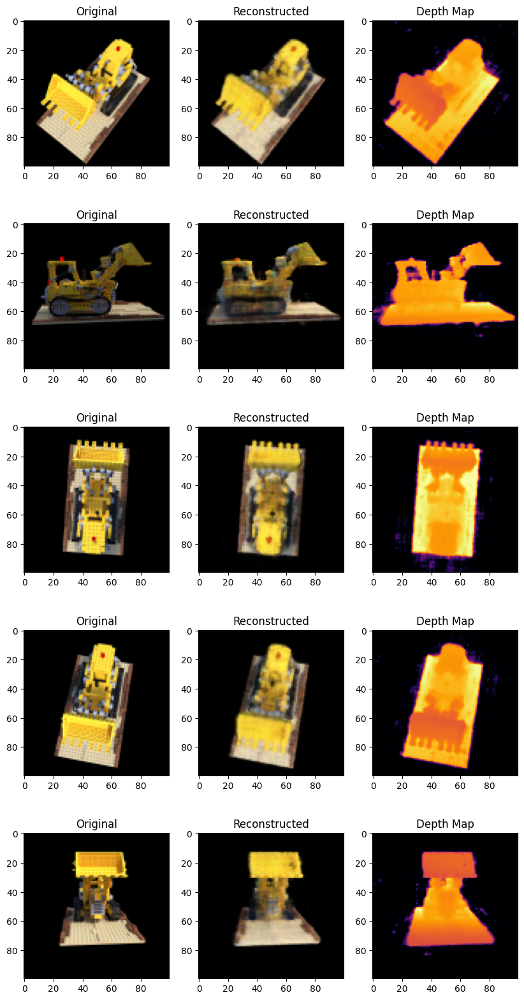

In [14]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from keras import utils

orig_images = monitor_images_batch

recons_images_fine, depth_maps_fine, _ = render_rays_hierarchical(
    model_coarse   = model.nerf_model_coarse,
    model_fine     = model.nerf_model_fine,
    ray_origins    = monitor_ray_origins_batch,
    ray_directions = monitor_ray_directions_batch,
    near           = 2.0,
    far            = 6.0,
    perturb_coarse = False,
    train          = False,
)

# Create subplots.
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(10, 20))

for ax, ori_img, recons_img, depth_map in zip(
    axes, orig_images, recons_images_fine, depth_maps_fine
):
    ax[0].imshow(keras.utils.array_to_img(ori_img))
    ax[0].set_title("Original")

    ax[1].imshow(keras.utils.array_to_img(recons_img))
    ax[1].set_title("Reconstructed")

    ax[2].imshow(keras.utils.array_to_img(depth_map[..., None]), cmap="inferno")
    ax[2].set_title("Depth Map")


In [17]:
# 노트북에서 한 번만 실행
import sys
!{sys.executable} -m pip install imageio[ffmpeg]


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 11.5 MB/s eta 0:00:00a 0:00:01


In [18]:
import numpy as np
import tensorflow as tf
from tqdm import tqdm
import imageio

# … pose_spherical, get_rays, render_rays_hierarchical, model setup …

nerf_coarse = model.nerf_model_coarse
nerf_fine   = model.nerf_model_fine

rgb_frames = []
depth_frames = []
thetas = np.linspace(0.0, 360.0, 120, endpoint=False)

for theta in tqdm(thetas, desc="Rendering frames"):
    # 1) camera‐to‐world
    c2w = pose_spherical(theta, -30.0, 4.0)

    # 2) unbatched rays of shape (H, W, 3)
    ray_origins, ray_directions = get_rays(H, W, focal, c2w)

    # 3) add batch dim → (1, H, W, 3)
    ray_origins   = ray_origins[None, ...]
    ray_directions= ray_directions[None, ...]

    # 4) render returns tensors of shape (1, H, W, 3) and (1, H, W)
    rgb_pred, depth_pred, _ = render_rays_hierarchical(
        model_coarse   = nerf_coarse,
        model_fine     = nerf_fine,
        ray_origins    = ray_origins,
        ray_directions = ray_directions,
        near           = 2.0,
        far            = 6.0,
        perturb_coarse = False,
        train          = False,
    )

    # 5) drop the batch dim
    rgb   = rgb_pred[0]   # shape (H, W, 3)
    depth = depth_pred[0] # shape (H, W)

    # 6) to uint8 images
    rgb_np   = (rgb.numpy()   * 255).astype(np.uint8)
    depth_np = (depth.numpy() * 255).astype(np.uint8)

    rgb_frames.append(rgb_np)
    depth_frames.append(depth_np)

# 7) write out
imageio.mimwrite("rgb_video.mp4",   rgb_frames,   fps=30)
imageio.mimwrite("depth_video.mp4", depth_frames, fps=30)

print("Saved: rgb_video.mp4 and depth_video.mp4")


Rendering frames: 100%|██████████| 120/120 [00:11<00:00, 10.53it/s]
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (100, 100) to (112, 112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x34175fc0] Warning: data is not aligned! This can lead to a speed loss
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (100, 100) to (112, 112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Saved: rgb_video.mp4 and depth_video.mp4


[swscaler @ 0x29acca40] Warning: data is not aligned! This can lead to a speed loss
